# SWB Trial-Averaged Power Plots


Created: 09/30/2024 \
Updated: 09/30/2024 \
*ran with 1 sec regression dfs from 09/24/2024*

In [1]:
import numpy as np
import mne
from glob import glob
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
from scipy.stats import zscore, linregress, ttest_ind, ttest_rel, ttest_1samp, pearsonr, spearmanr
import pandas as pd
from mne.preprocessing.bads import _find_outliers
import os 
import joblib
import re
import datetime
import scipy
import random
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.regression.mixed_linear_model import MixedLM 
from joblib import Parallel, delayed
import pickle
import itertools
import time 
from matplotlib.ticker import StrMethodFormatter
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
import matplotlib as mpl
from matplotlib import cm
import patsy
from statsmodels.api import OLS
from scipy import stats
from tqdm import tqdm
from sklearn.linear_model import RANSACRegressor, LinearRegression
from sklearn.metrics import r2_score, mean_squared_error


import warnings
warnings.filterwarnings('ignore')




In [2]:
%load_ext autoreload
%autoreload 2



In [3]:
# Specify root directory for un-archived data and results 
base_dir   = '/sc/arion/projects/guLab/Alie/SWB/ephys_analysis/'
anat_dir   = f'{base_dir}recon_labels/'
neural_dir = f'{base_dir}data/'
save_dir   = f'{base_dir}results/bandpow_encoding_models/'
fig_dir    = f'{base_dir}figs/bandpow_regressions/'
script_dir = '/hpc/users/finka03/swb_ephys_analysis/scripts/'

date = datetime.date.today().strftime('%m%d%Y')
print(date)



09302024


In [4]:
import sys
sys.path.append(f'{base_dir}LFPAnalysis/')

from LFPAnalysis import analysis_utils

sys.path.append(f'{script_dir}analysis_notebooks/')

from ieeg_tools import *
from plot_tools import *



In [5]:
subj_ids = list(pd.read_excel(f'{base_dir}/subj_info/SWB_subjects.xlsx', sheet_name='Usable_Subjects', usecols=[0]).PatientID)
n_subj = len(subj_ids)
# subj_ids


In [6]:
bdi_list = pd.read_excel(f'{base_dir}/subj_info/SWB_subjects.xlsx', sheet_name='Usable_Subjects', usecols=[3])
bdi_list = list(bdi_list.SWB_BDI)
subj_info_df = pd.DataFrame({'subj_id':subj_ids,'bdi':bdi_list})
subj_info_df



,subj_id,bdi
0,MS002,14
1,MS003,8
2,MS009,16
3,MS011,13
4,MS015,26
5,MS016,10
6,MS017,26
7,MS019,12
8,MS022,10
9,MS024,16


# Load Pow Df

In [7]:
epoch_len = '1sec'
band = 'hfa'

In [8]:
hfa_df = pd.read_csv(f'{save_dir}regression_dfs/{band}_master_df_{epoch_len}.csv')
hfa_df.subj_id.unique()



array(['MS002', 'MS003', 'MS009', 'MS011', 'MS015', 'MS016', 'MS017',
       'MS019', 'MS022', 'MS024', 'MS025', 'MS026', 'MS027', 'MS028',
       'MS029', 'MS030', 'MS033', 'MS035', 'MS041', 'MS043', 'MS048',
       'MS050', 'DA8', 'DA023', 'DA026', 'DA037', 'DA039'], dtype=object)

In [9]:
hfa_df.columns

Index(['Unnamed: 0', 'subj_id', 'bdi', 'bdi_thresh', 'Round', 'RT',
       'TrialOnset', 'ChoiceOnset', 'DecisionOnset', 'FeedbackOnset',
       'ChoicePos', 'TrialType', 'SafeBet', 'LowBet', 'HighBet',
       'GambleChoice', 'Outcome', 'Profit', 'TotalProfit', 'epoch', 'logRT',
       'GambleEV', 'TrialEV', 'CR', 'choiceEV', 'rpe', 'res_type', 'cf',
       'max_cf', 'cpe', 'max_cpe', 'Round_t1', 'RT_t1', 'ChoicePos_t1',
       'TrialType_t1', 'SafeBet_t1', 'LowBet_t1', 'HighBet_t1',
       'GambleChoice_t1', 'Outcome_t1', 'Profit_t1', 'TotalProfit_t1',
       'epoch_t1', 'logRT_t1', 'GambleEV_t1', 'TrialEV_t1', 'CR_t1',
       'choiceEV_t1', 'rpe_t1', 'res_type_t1', 'cf_t1', 'max_cf_t1', 'cpe_t1',
       'max_cpe_t1', 'keep_epoch', 'keep_epoch_t1', 'CpeOnset',
       'reref_ch_names', 'band_pow', 'roi', 'hemi', 'unique_reref_ch'],
      dtype='object')

In [10]:
roi_reref_labels_master_df = pd.read_csv(
    glob(f'{base_dir}results/roi_info/roi_reref_labels_master.csv')[0])
roi_reref_labels_master_df = roi_reref_labels_master_df.drop(columns=['Unnamed: 0'])




In [11]:
roi_reref_labels_master_df.roi.value_counts()



roi
dmpfc            225
ofc              202
acc              193
sts              155
hpc              135
amy              113
dlpfc            107
temporal         105
vlpfc             82
ains              71
pins              60
thalamus          58
temporal pole     31
mcc               28
phg               25
motor             25
parietal          24
vmpfc             23
caudate            8
pcc                1
Name: count, dtype: int64

In [12]:
# keep_rois = roi_reref_labels_master_df.roi.value_counts().index[
#     roi_reref_labels_master_df.roi.value_counts().values>=50].tolist()

keep_rois = ['dlpfc','vlpfc','dmpfc','ofc','ains','pins','acc','amy','hpc']     

keep_rois

['dlpfc', 'vlpfc', 'dmpfc', 'ofc', 'ains', 'pins', 'acc', 'amy', 'hpc']

In [13]:
# ####### NEW DATA FRAME 
hfa_reg_df = hfa_df.copy()
hfa_reg_df = hfa_reg_df[hfa_reg_df.roi.isin(keep_rois)]
# len(beta_reg_df)



# BDI x Power Modulations
- Correlate mean beta power across ROIs with BDI

In [14]:
mean_df = hfa_reg_df.groupby('unique_reref_ch').agg('mean',numeric_only=True)
mean_df.columns
mean_df['roi'] = [hfa_reg_df[hfa_reg_df.unique_reref_ch==ch].roi.unique()[0] for ch in hfa_reg_df.unique_reref_ch.unique().tolist()]
mean_df = mean_df.reset_index()

In [18]:
mean_df.head()

,unique_reref_ch,Unnamed: 0,bdi,Round,RT,TrialOnset,ChoiceOnset,DecisionOnset,FeedbackOnset,SafeBet,...,CR_t1,choiceEV_t1,rpe_t1,cf_t1,max_cf_t1,cpe_t1,max_cpe_t1,CpeOnset,band_pow,roi
0,DA023_lac1-lac2,241401.0,14.0,74.598639,2.733663,1077.47613,1077.487614,1080.221278,1081.268066,-0.000982,...,-0.002539,0.003291,-0.004088,0.004444,0.006508,-0.005434,-0.006292,1082.221278,0.025930,acc
1,DA023_lac10-lac11,242430.0,14.0,74.598639,2.733663,1077.47613,1077.487614,1080.221278,1081.268066,-0.000982,...,-0.002539,0.003291,-0.004088,0.004444,0.006508,-0.005434,-0.006292,1082.221278,0.007828,acc
2,DA023_lac2-lac3,241548.0,14.0,74.598639,2.733663,1077.47613,1077.487614,1080.221278,1081.268066,-0.000982,...,-0.002539,0.003291,-0.004088,0.004444,0.006508,-0.005434,-0.006292,1082.221278,0.024987,acc
3,DA023_lac3-lac4,241695.0,14.0,74.598639,2.733663,1077.47613,1077.487614,1080.221278,1081.268066,-0.000982,...,-0.002539,0.003291,-0.004088,0.004444,0.006508,-0.005434,-0.006292,1082.221278,0.029809,acc
4,DA023_lac4-lac5,241842.0,14.0,74.598639,2.733663,1077.47613,1077.487614,1080.221278,1081.268066,-0.000982,...,-0.002539,0.003291,-0.004088,0.004444,0.006508,-0.005434,-0.006292,1082.221278,0.063681,acc


In [19]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in mean_df.roi.unique().tolist():
    roi_df = mean_df[mean_df.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.band_pow.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  193
Model:                            RLM   Df Residuals:                      191
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Mon, 30 Sep 2024                                         
Time:                        18:58:20                                         
No. Iterations:                    13                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         15.3139      0.417     36.757     

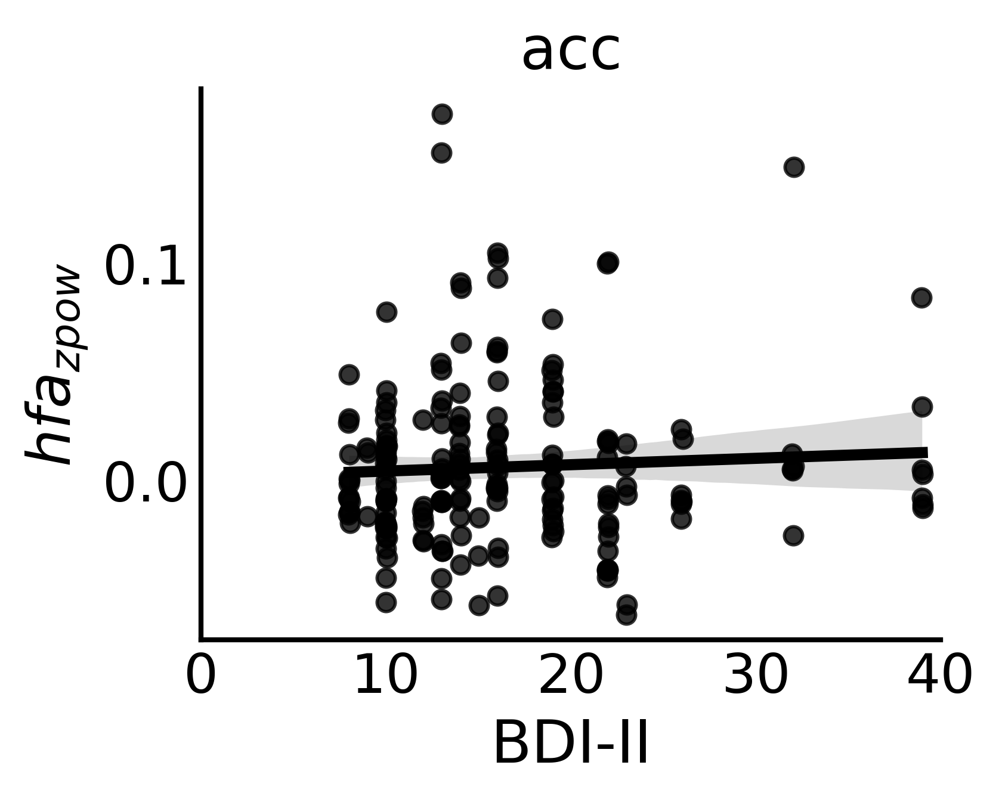

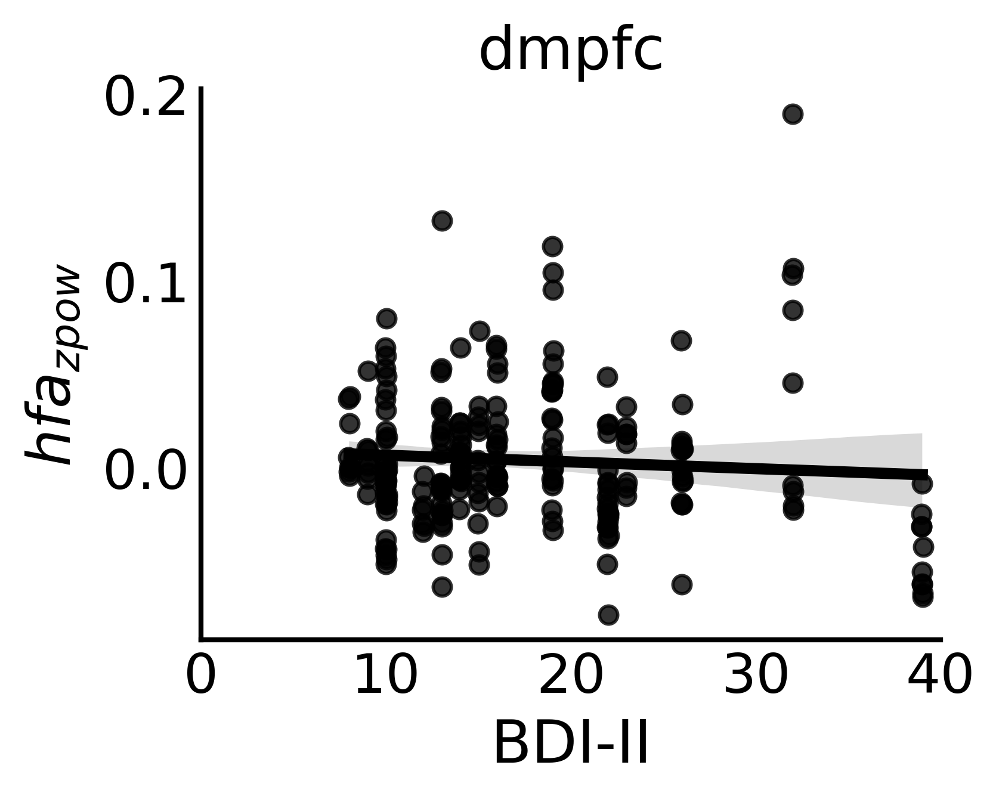

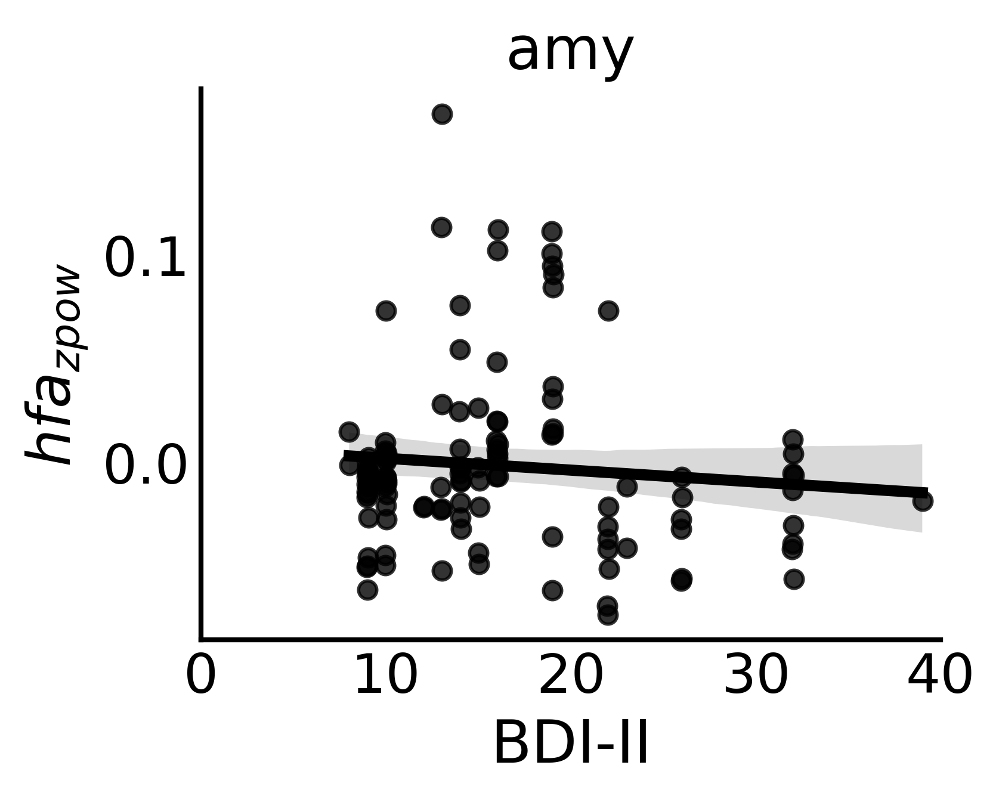

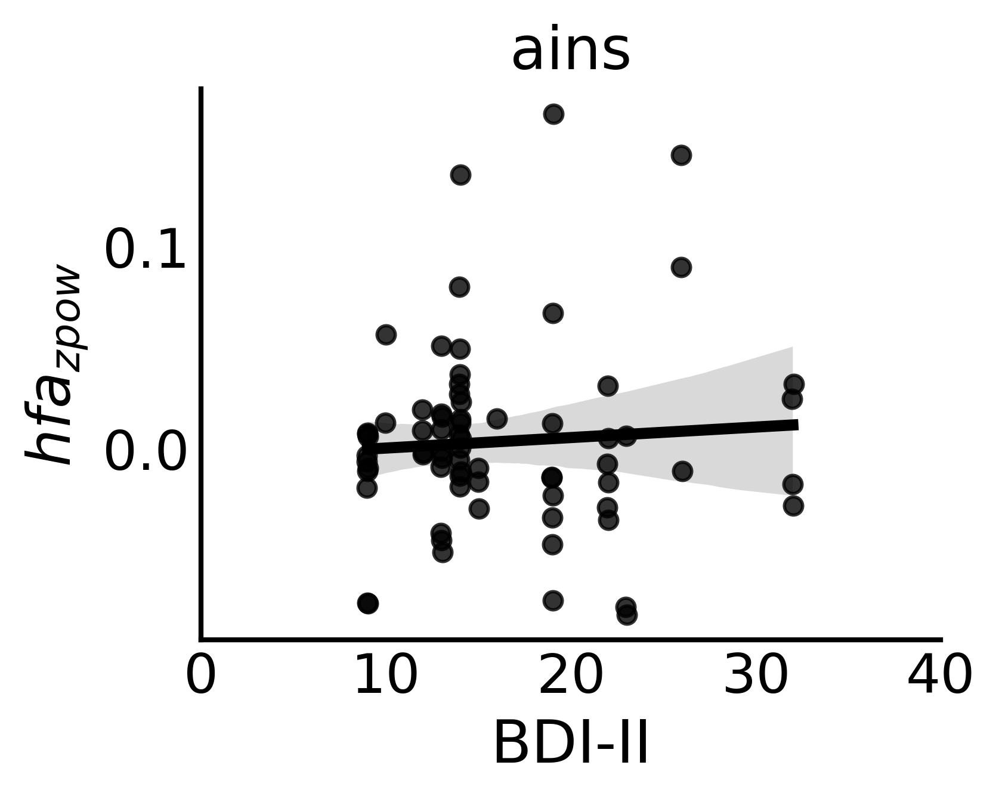

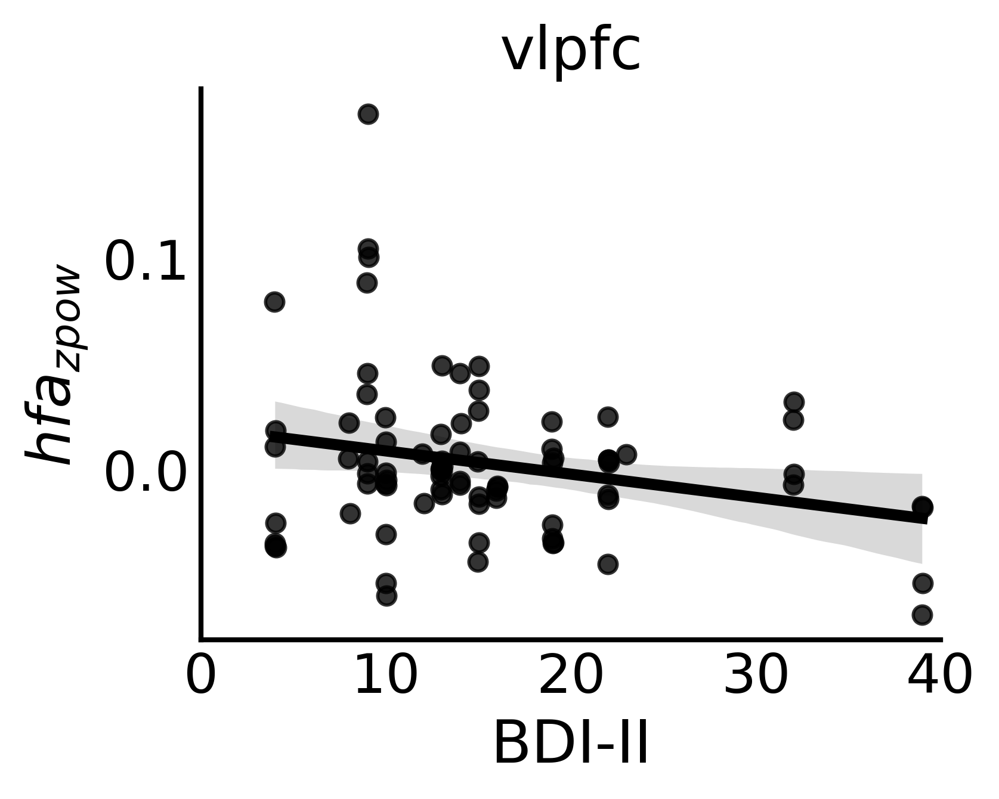

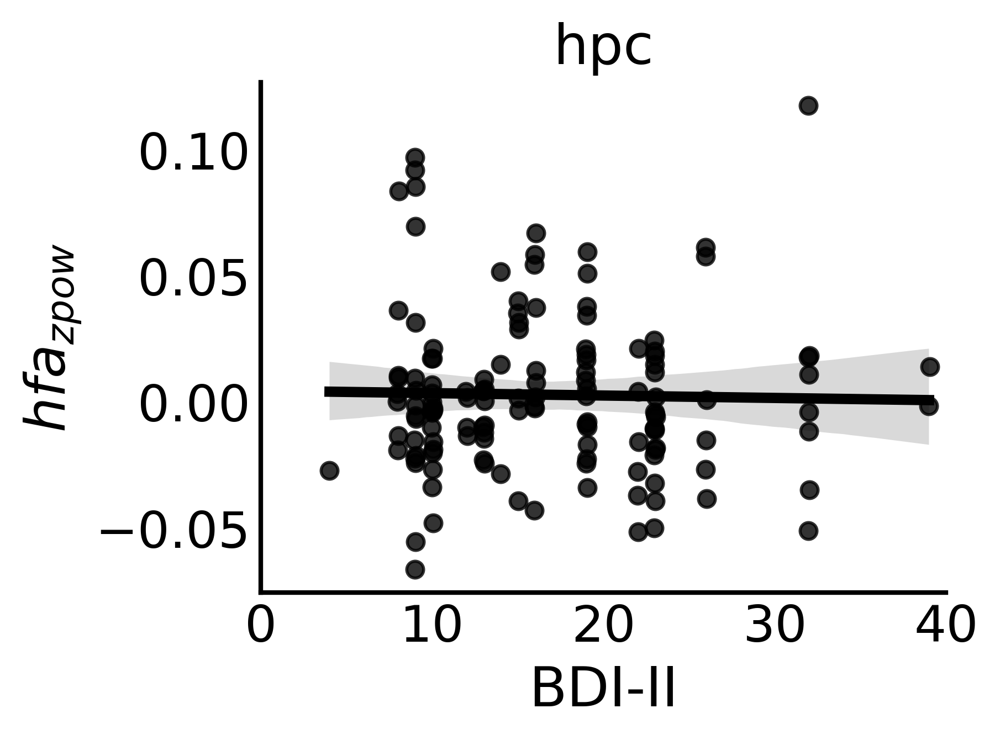

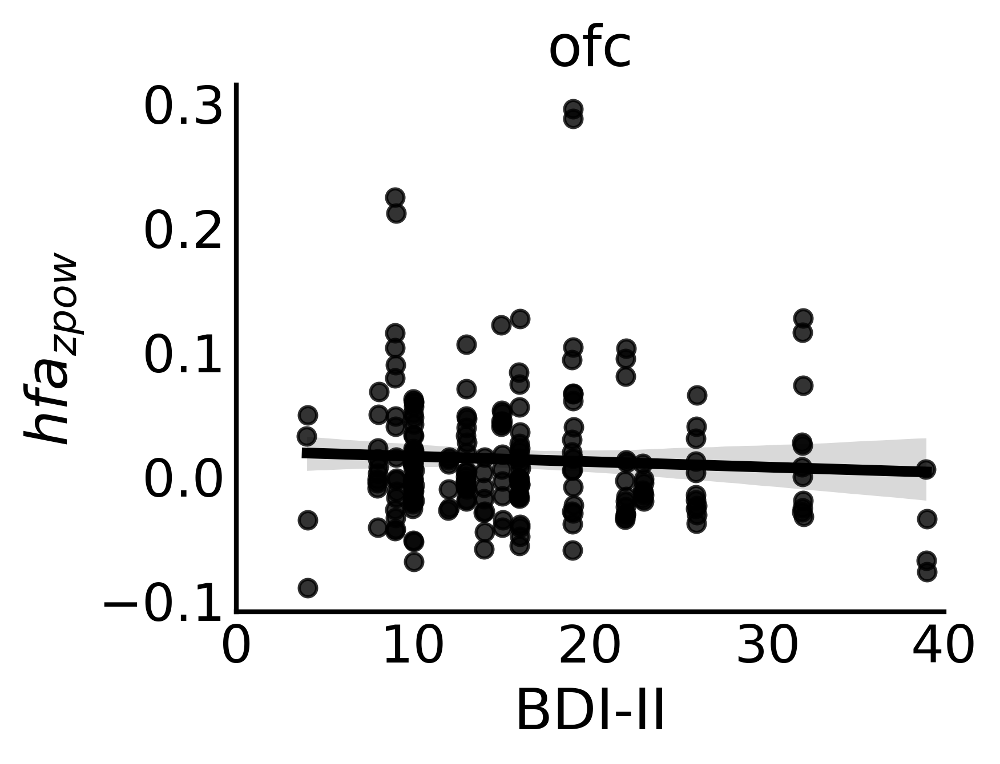

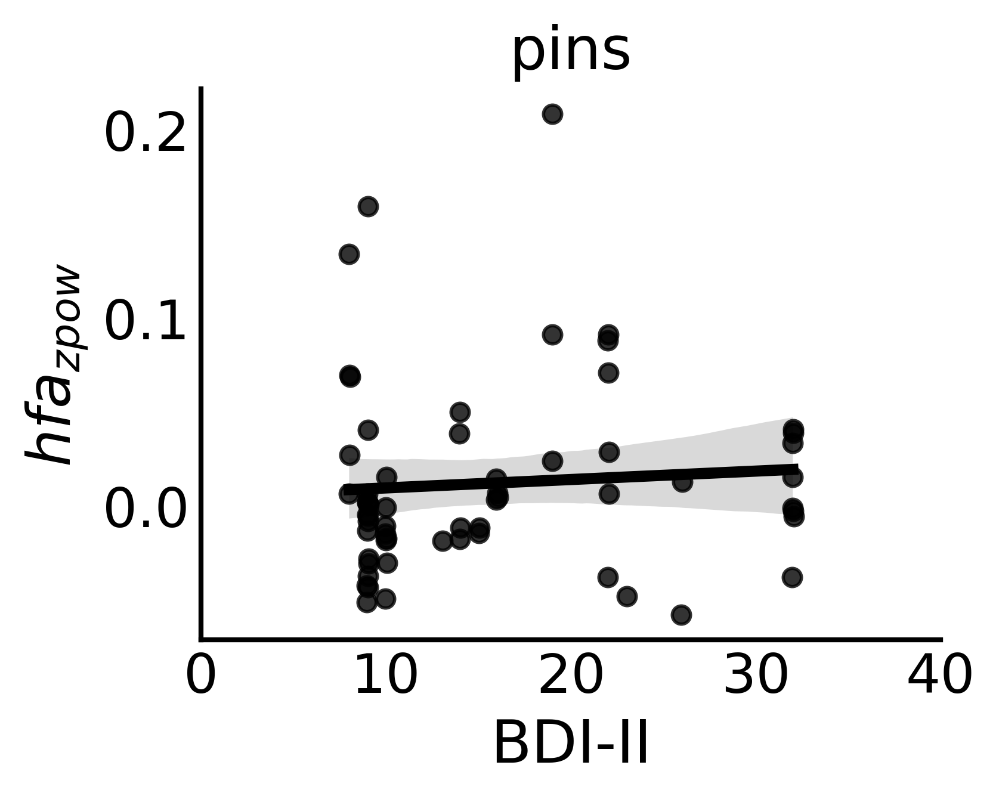

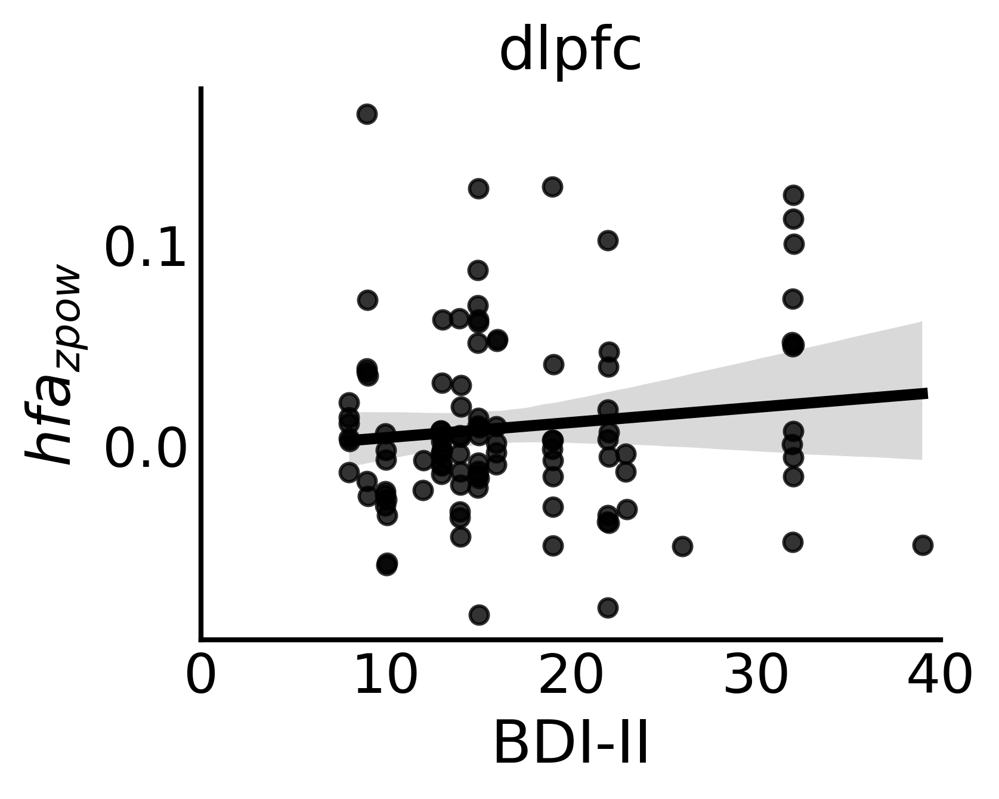

In [20]:
corr_fig_dir = f'{fig_dir}{band}/{band}_pow_bdi_corr/'
os.makedirs(corr_fig_dir,exist_ok=True)


sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in mean_df.roi.unique().tolist():
        
    roi_temp_data = mean_df[mean_df.roi==roi]
    
    fig_id = f'{band}_{roi}_bdi_pow_corr.pdf'
    
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='band_pow',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'${band}_{{zpow}}$')


    plt.title(f'{roi}')
    sns.despine()
    

    plt.savefig(f'{corr_fig_dir}{fig_id}', format=fig_id.split('.')[-1], metadata=None,
        bbox_inches='tight', pad_inches=0.1,dpi=400,
        facecolor='auto', edgecolor='auto',
        backend=None)
    

    


# ROI Band Pow x CPE (no bdi split)

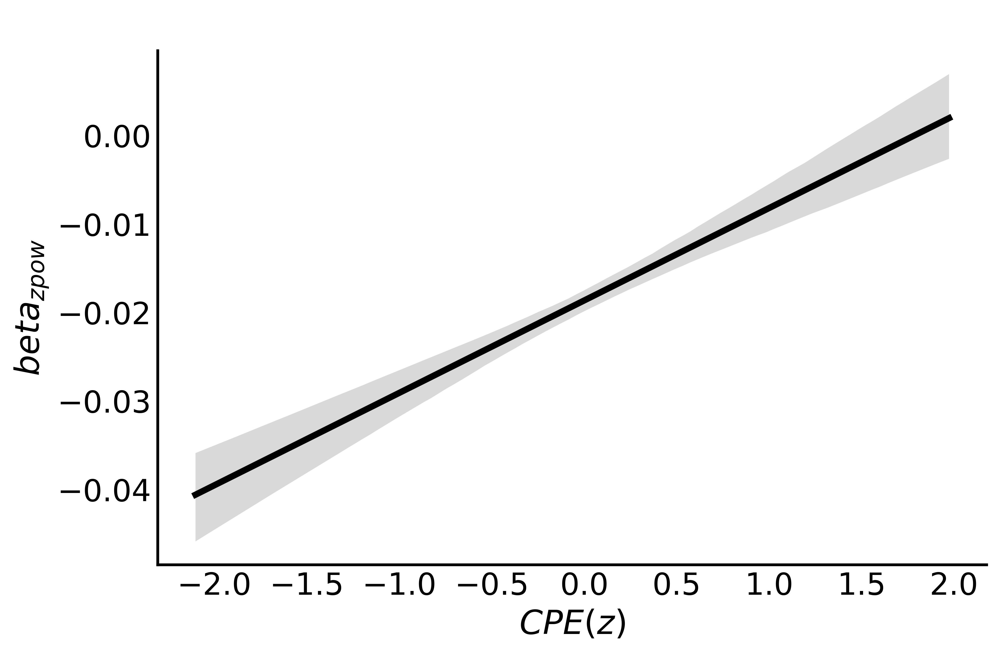

In [47]:
fig,ax = plt.subplots(figsize=(8,5),dpi=500)


sns.regplot(data=beta_reg_df,x='cpe',y='band_pow',scatter=False,
           ci=95,color = 'k')

plt.legend(fontsize=10)
# borderaxespad=0,frameon=False,framealpha=0,
sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1.1), frameon=False,framealpha=0,
                fontsize='small',shadow=None,
                columnspacing=2,ncol=2)


plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

plt.ylabel(r'$beta_{{{zpow}}}$')
plt.xlabel(r'$CPE(z)$')
sns.despine()
plt.tick_params(length=0)
# plt.text(7.25,0.07,f'rho: {np.round(r,3)} \n p: {np.round(p_r,6)}',fontsize=16)


# plt.savefig(f'{fig_save_dir}/all_lmplot_cpe_bpow_bdi_{date}.pdf', format='pdf', metadata=None,
# bbox_inches='tight', pad_inches=0.1,dpi=500,
# facecolor='auto', edgecolor='auto',
# backend=None)

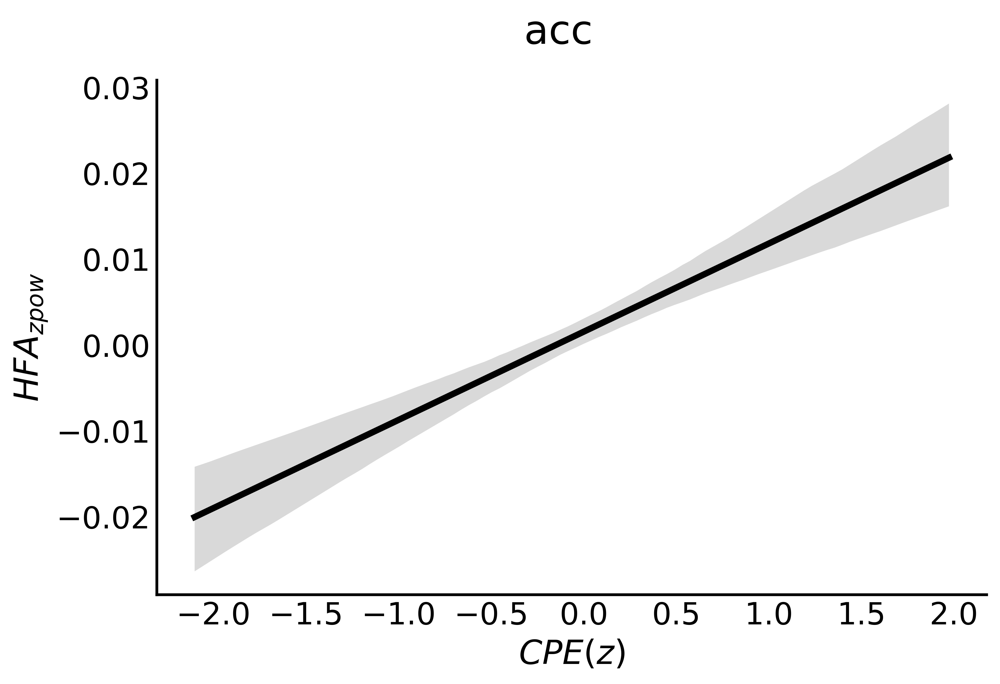

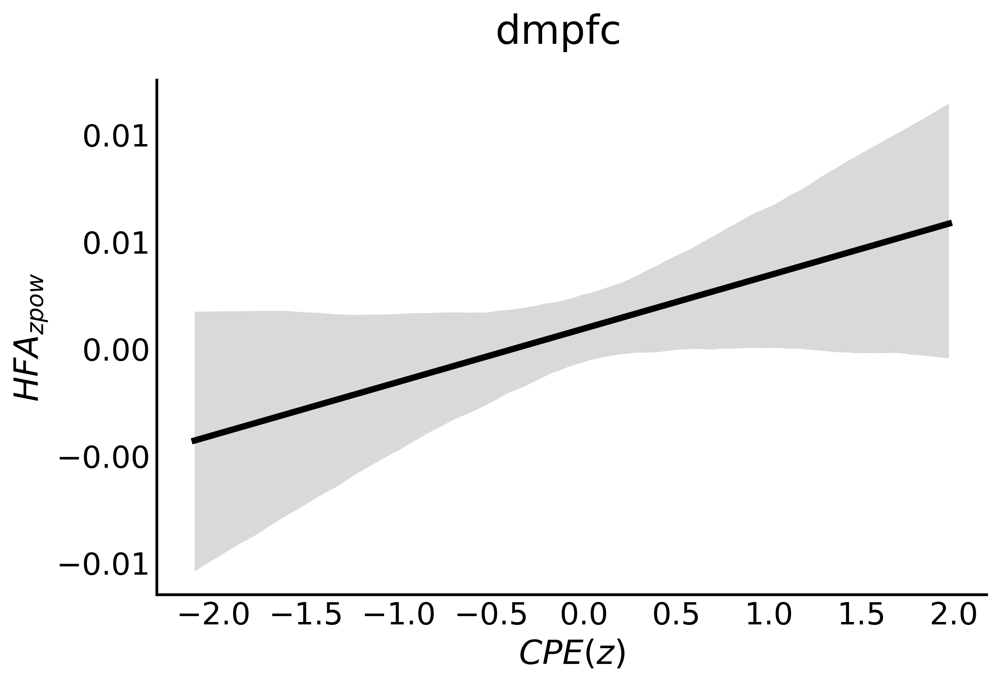

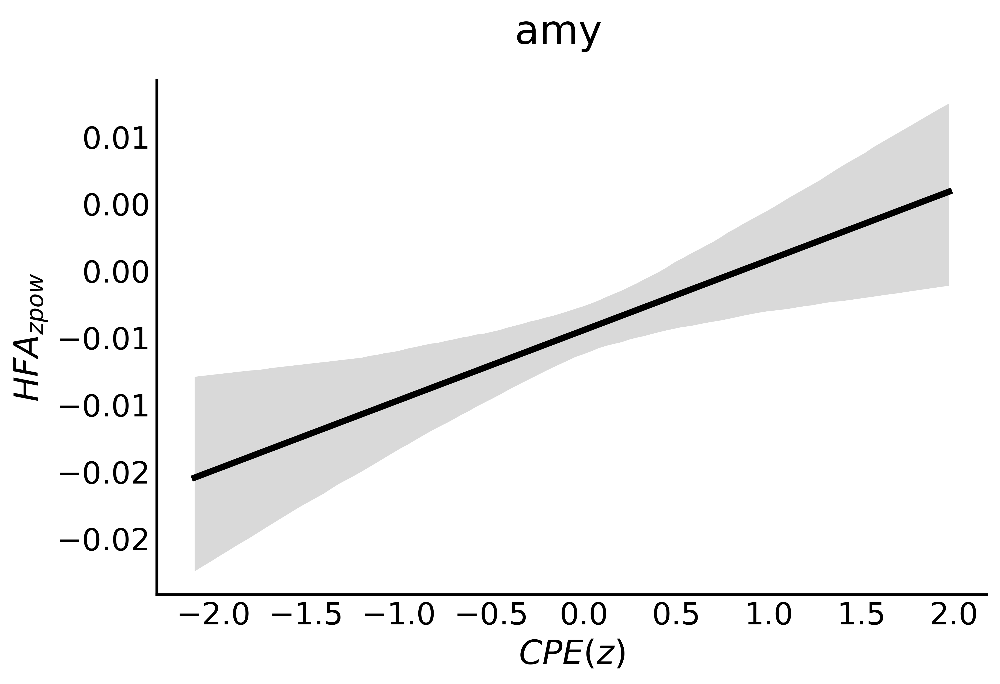

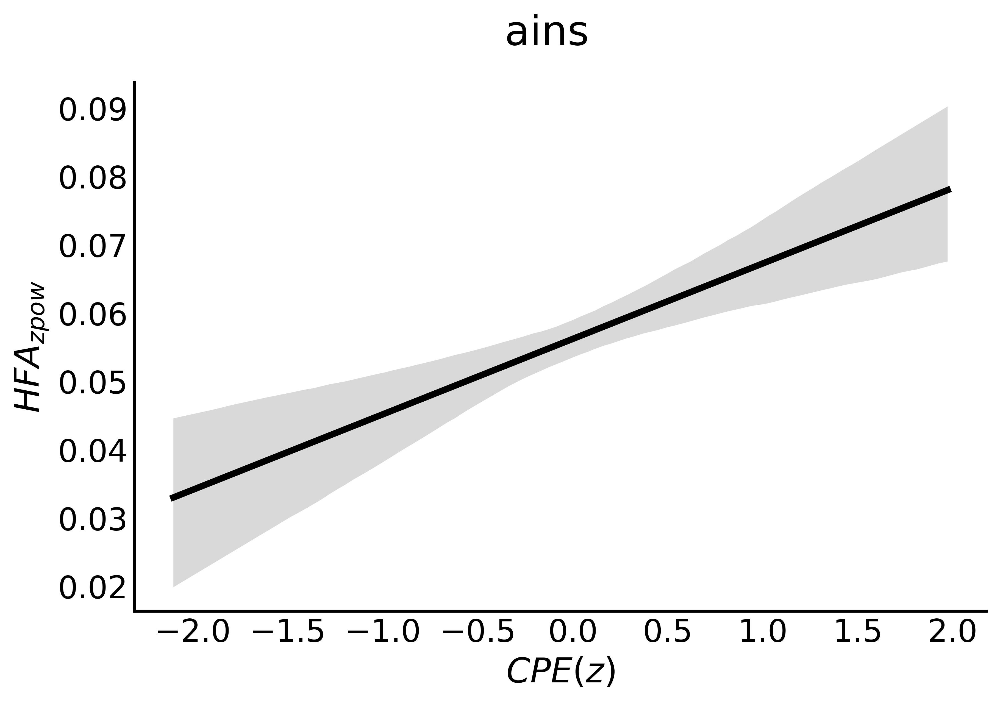

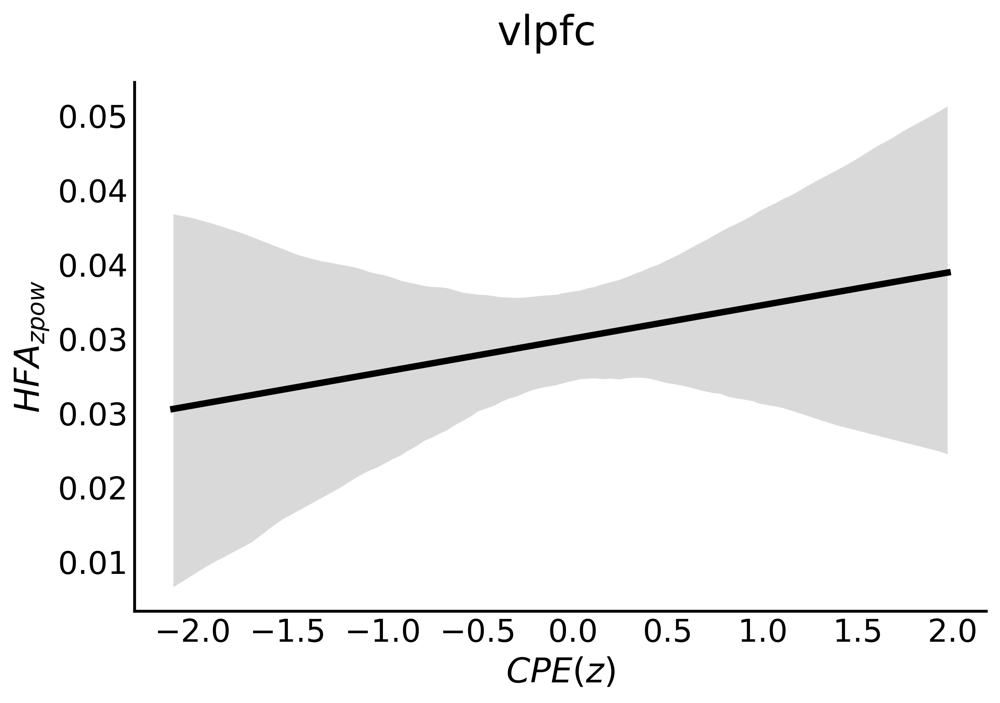

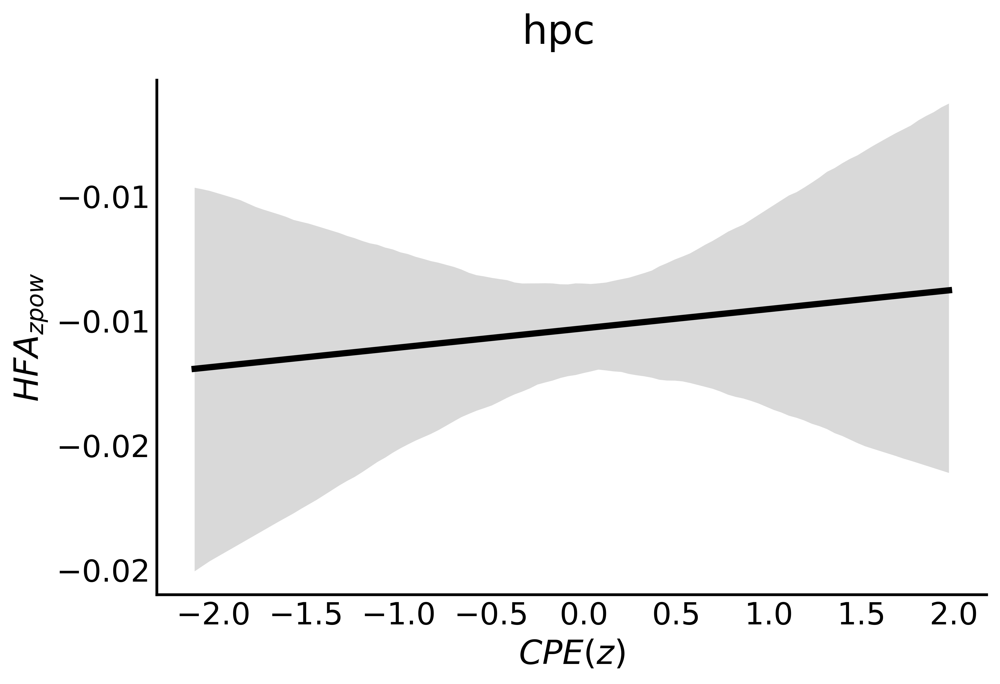

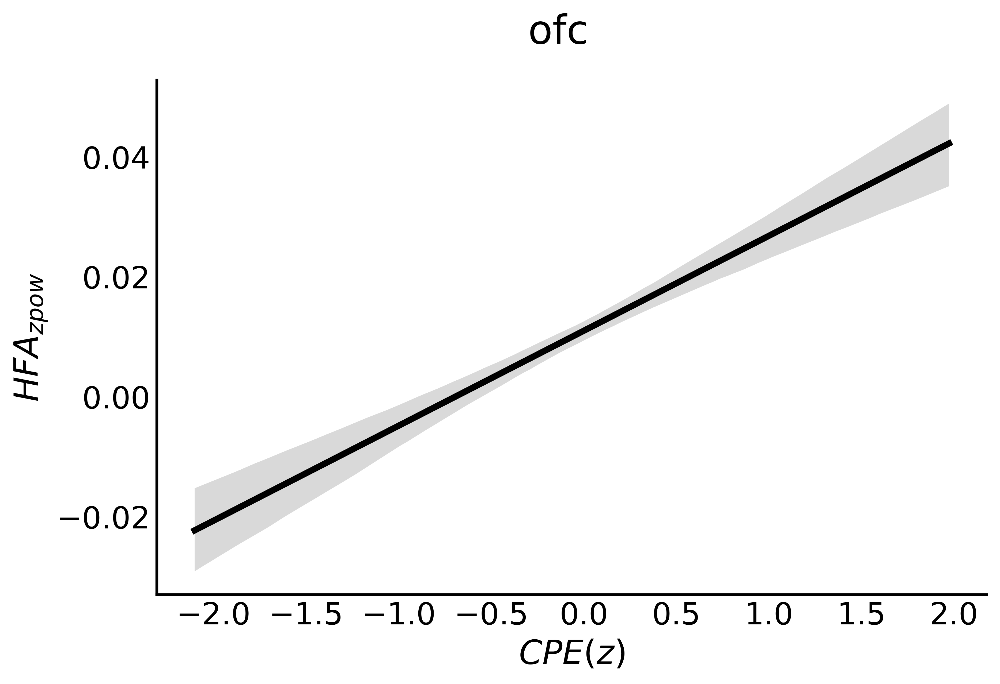

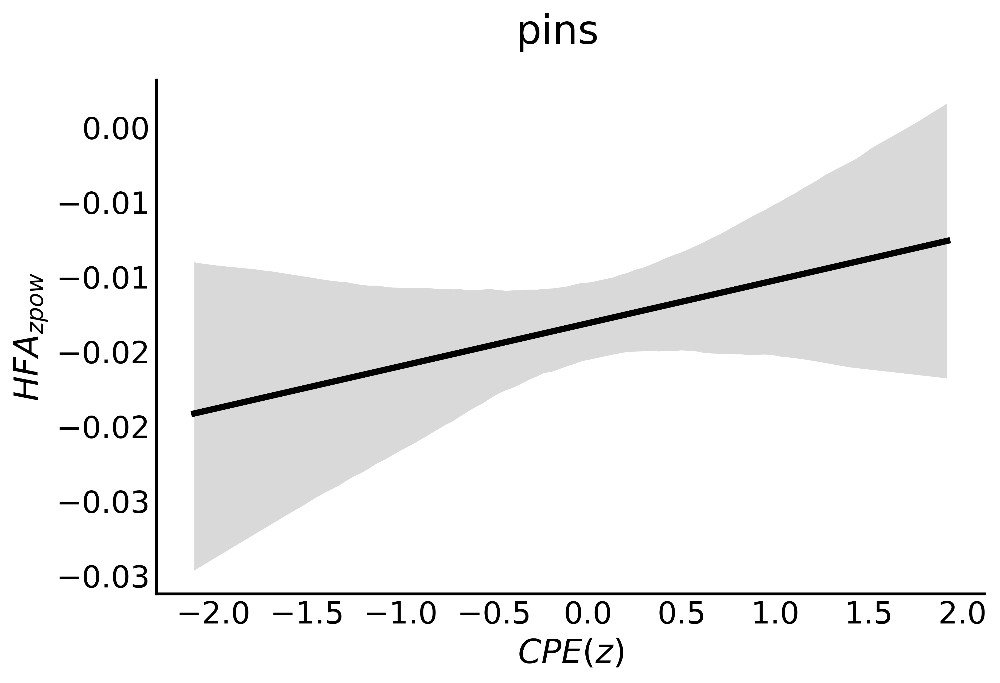

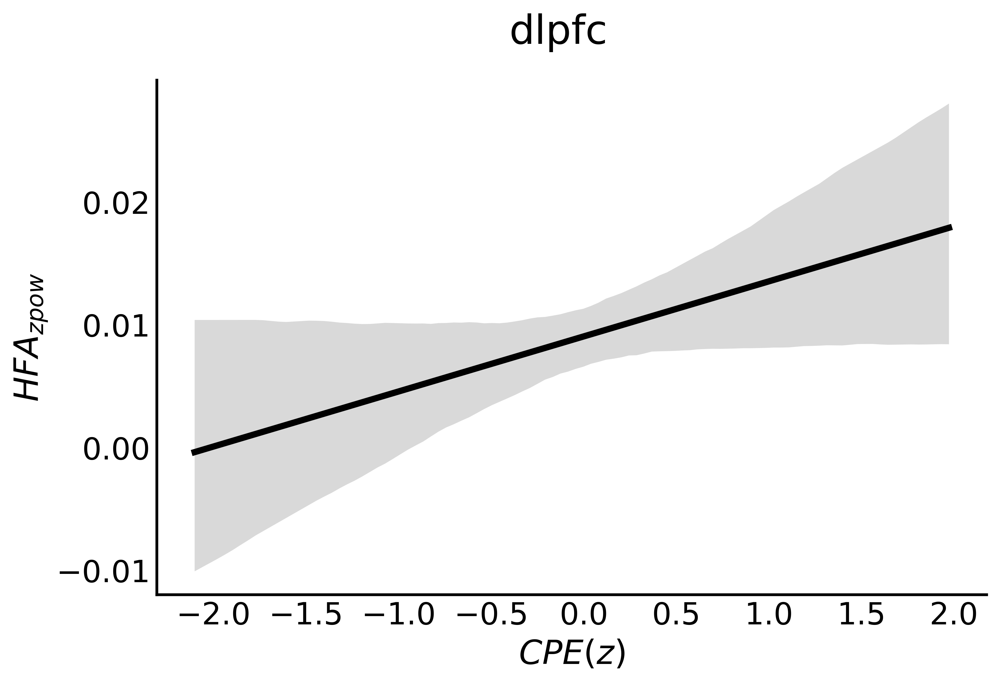

In [21]:
# corr_fig_dir = f'{fig_dir}{band}/{band}_pow_bdi_corr/'
# os.makedirs(corr_fig_dir,exist_ok=True)


# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in hfa_reg_df.roi.unique().tolist():
        
    roi_df = hfa_reg_df[hfa_reg_df.roi==roi]
    
#     fig_id = f'{band}_{roi}_bdi_pow_corr.pdf'

    fig,ax = plt.subplots(figsize=(8,5),dpi=500)


    sns.regplot(data=roi_df,x='cpe',y='band_pow',scatter=False,
               ci=95,color = 'k')

    plt.legend(fontsize=10)
    # borderaxespad=0,frameon=False,framealpha=0,
    sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1.1), frameon=False,framealpha=0,
                    fontsize='small',shadow=None,
                    columnspacing=2,ncol=2)


    plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

    plt.ylabel(r'$HFA_{{{zpow}}}$')
    plt.xlabel(r'$CPE(z)$')
    fig.suptitle(roi)
    sns.despine()
    plt.tick_params(length=0)


    # plt.savefig(f'{fig_save_dir}/all_lmplot_cpe_bpow_bdi_{date}.pdf', format='pdf', metadata=None,
    # bbox_inches='tight', pad_inches=0.1,dpi=500,
    # facecolor='auto', edgecolor='auto',
    # backend=None)

# ROI Band Pow ~ CPE (BDI split)

In [23]:
hfa_reg_df.head()

,Unnamed: 0,subj_id,bdi,bdi_thresh,Round,RT,TrialOnset,ChoiceOnset,DecisionOnset,FeedbackOnset,...,cpe_t1,max_cpe_t1,keep_epoch,keep_epoch_t1,CpeOnset,reref_ch_names,band_pow,roi,hemi,unique_reref_ch
0,0,MS002,14,low,1,2.059852,513.380590,513.390239,515.450091,515.457173,...,-0.451721,-0.457514,keep,keep,517.450091,lacas1-lacas2,0.246492,acc,l,MS002_lacas1-lacas2
1,1,MS002,14,low,2,1.954564,522.640856,522.641563,524.596127,526.627092,...,0.731568,0.723865,keep,keep,526.596127,lacas1-lacas2,-0.102350,acc,l,MS002_lacas1-lacas2
2,2,MS002,14,low,3,1.583462,531.174799,531.175599,532.759061,534.780269,...,0.437278,0.328575,keep,keep,534.759061,lacas1-lacas2,0.204249,acc,l,MS002_lacas1-lacas2
3,3,MS002,14,low,4,2.491611,545.592613,545.593355,548.084966,548.092333,...,0.400492,0.526220,keep,keep,550.084966,lacas1-lacas2,0.018072,acc,l,MS002_lacas1-lacas2
4,4,MS002,14,low,5,1.768936,555.337336,555.345720,557.114656,559.135069,...,0.621209,0.463333,keep,keep,559.114656,lacas1-lacas2,0.303294,acc,l,MS002_lacas1-lacas2


In [24]:
hfa_reg_df.columns

Index(['Unnamed: 0', 'subj_id', 'bdi', 'bdi_thresh', 'Round', 'RT',
       'TrialOnset', 'ChoiceOnset', 'DecisionOnset', 'FeedbackOnset',
       'ChoicePos', 'TrialType', 'SafeBet', 'LowBet', 'HighBet',
       'GambleChoice', 'Outcome', 'Profit', 'TotalProfit', 'epoch', 'logRT',
       'GambleEV', 'TrialEV', 'CR', 'choiceEV', 'rpe', 'res_type', 'cf',
       'max_cf', 'cpe', 'max_cpe', 'Round_t1', 'RT_t1', 'ChoicePos_t1',
       'TrialType_t1', 'SafeBet_t1', 'LowBet_t1', 'HighBet_t1',
       'GambleChoice_t1', 'Outcome_t1', 'Profit_t1', 'TotalProfit_t1',
       'epoch_t1', 'logRT_t1', 'GambleEV_t1', 'TrialEV_t1', 'CR_t1',
       'choiceEV_t1', 'rpe_t1', 'res_type_t1', 'cf_t1', 'max_cf_t1', 'cpe_t1',
       'max_cpe_t1', 'keep_epoch', 'keep_epoch_t1', 'CpeOnset',
       'reref_ch_names', 'band_pow', 'roi', 'hemi', 'unique_reref_ch'],
      dtype='object')

In [25]:
mean_df.head()

,unique_reref_ch,Unnamed: 0,bdi,Round,RT,TrialOnset,ChoiceOnset,DecisionOnset,FeedbackOnset,SafeBet,...,CR_t1,choiceEV_t1,rpe_t1,cf_t1,max_cf_t1,cpe_t1,max_cpe_t1,CpeOnset,band_pow,roi
0,DA023_lac1-lac2,241401.0,14.0,74.598639,2.733663,1077.47613,1077.487614,1080.221278,1081.268066,-0.000982,...,-0.002539,0.003291,-0.004088,0.004444,0.006508,-0.005434,-0.006292,1082.221278,0.025930,acc
1,DA023_lac10-lac11,242430.0,14.0,74.598639,2.733663,1077.47613,1077.487614,1080.221278,1081.268066,-0.000982,...,-0.002539,0.003291,-0.004088,0.004444,0.006508,-0.005434,-0.006292,1082.221278,0.007828,acc
2,DA023_lac2-lac3,241548.0,14.0,74.598639,2.733663,1077.47613,1077.487614,1080.221278,1081.268066,-0.000982,...,-0.002539,0.003291,-0.004088,0.004444,0.006508,-0.005434,-0.006292,1082.221278,0.024987,acc
3,DA023_lac3-lac4,241695.0,14.0,74.598639,2.733663,1077.47613,1077.487614,1080.221278,1081.268066,-0.000982,...,-0.002539,0.003291,-0.004088,0.004444,0.006508,-0.005434,-0.006292,1082.221278,0.029809,acc
4,DA023_lac4-lac5,241842.0,14.0,74.598639,2.733663,1077.47613,1077.487614,1080.221278,1081.268066,-0.000982,...,-0.002539,0.003291,-0.004088,0.004444,0.006508,-0.005434,-0.006292,1082.221278,0.063681,acc


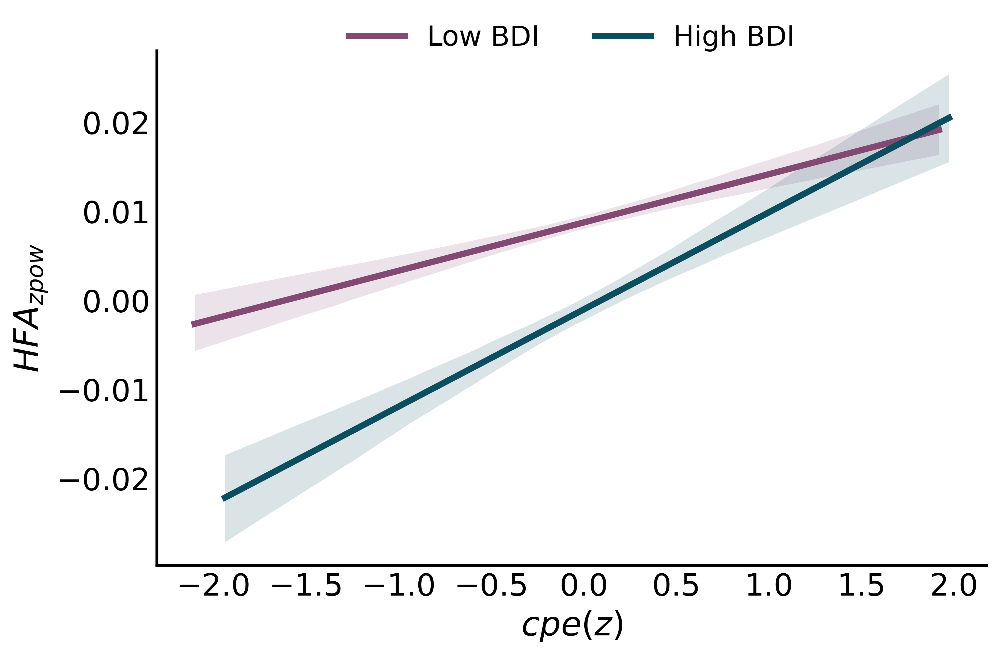

In [28]:
# sns.set_theme(style='ticks') 
# sns.set_context("poster")

# from matplotlib import rc
# rc('text', usetex=False)


fig,ax = plt.subplots(figsize=(8,5),dpi=500)
# sns.set_context("poster",rc={'axes.linewidth': 2})
# sns.set_theme(style='ticks') 

# palette={'depression':"#3f2755",'no depression':"#054a6f"}

palette={'high':"#0b4e5f",'low':"#824973"}


# ax = sns.lmplot(data=beta_reg_df,x='decisionCPE',y='band_pow',hue='Depression',scatter=False,ci=95,palette=palette)
# sns.move_legend(ax, loc='lower center', bbox_to_anchor=(0.1, 1),bbox_to_anchor=(-1, 0), ncol=2)

# sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1), borderaxespad=0.1,frameon=False,framealpha=0,
#                 fontsize='x-small',shadow=None,title=None,columnspacing=0.5,edgecolor=None,markerfirst=True,
#                 markerscale=4,labelcolor=None, ncol=2)


sns.regplot(data=hfa_reg_df[hfa_reg_df.bdi_thresh=='low'],x='cpe',y='band_pow',scatter=False,
           ci=95,color = '#824973',label='Low BDI')
sns.regplot(data=hfa_reg_df[hfa_reg_df.bdi_thresh=='high'],x='cpe',y='band_pow',scatter=False,
           ci=95,color='#0b4e5f',label='High BDI')

plt.legend(fontsize=10)
# borderaxespad=0,frameon=False,framealpha=0,
sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1.1), frameon=False,framealpha=0,
                fontsize='small',shadow=None,
                columnspacing=2,ncol=2)


plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

plt.ylabel(r'$HFA_{{{zpow}}}$')
plt.xlabel(r'$cpe(z)$')
sns.despine()
plt.tick_params(length=0)
# plt.text(7.25,0.07,f'rho: {np.round(r,3)} \n p: {np.round(p_r,6)}',fontsize=16)


# plt.savefig(f'{fig_save_dir}/all_lmplot_cpe_bpow_bdi_{date}.pdf', format='pdf', metadata=None,
# bbox_inches='tight', pad_inches=0.1,dpi=500,
# facecolor='auto', edgecolor='auto',
# backend=None)

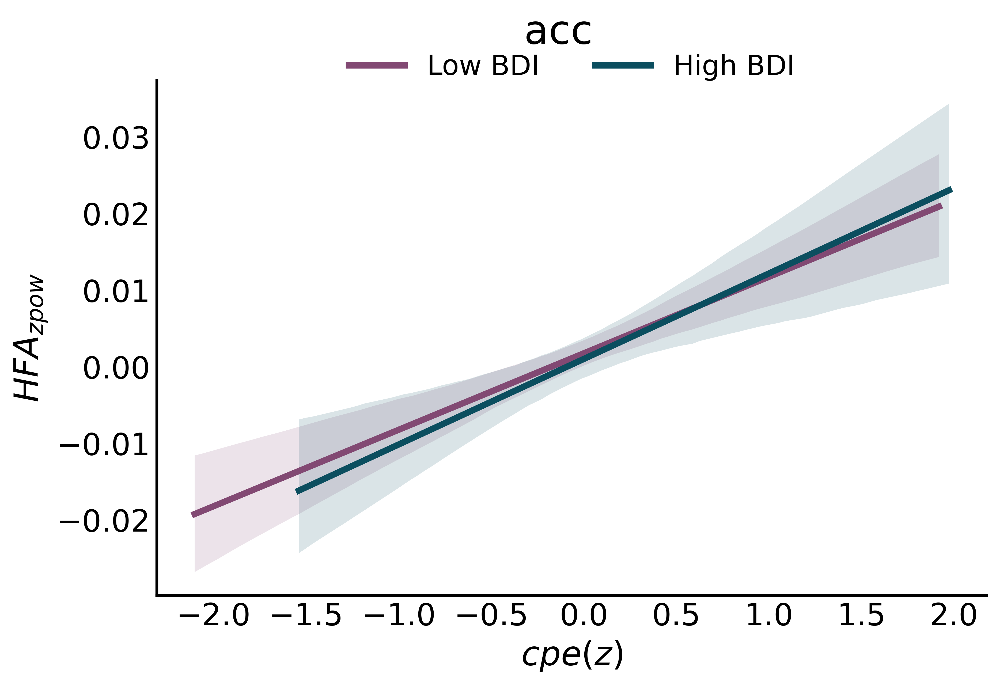

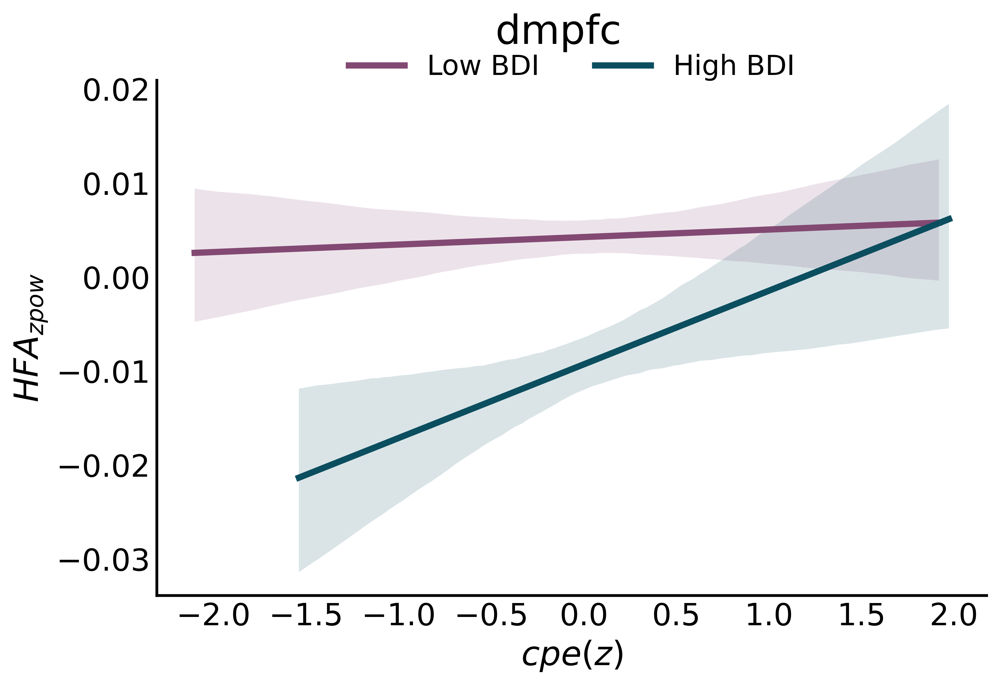

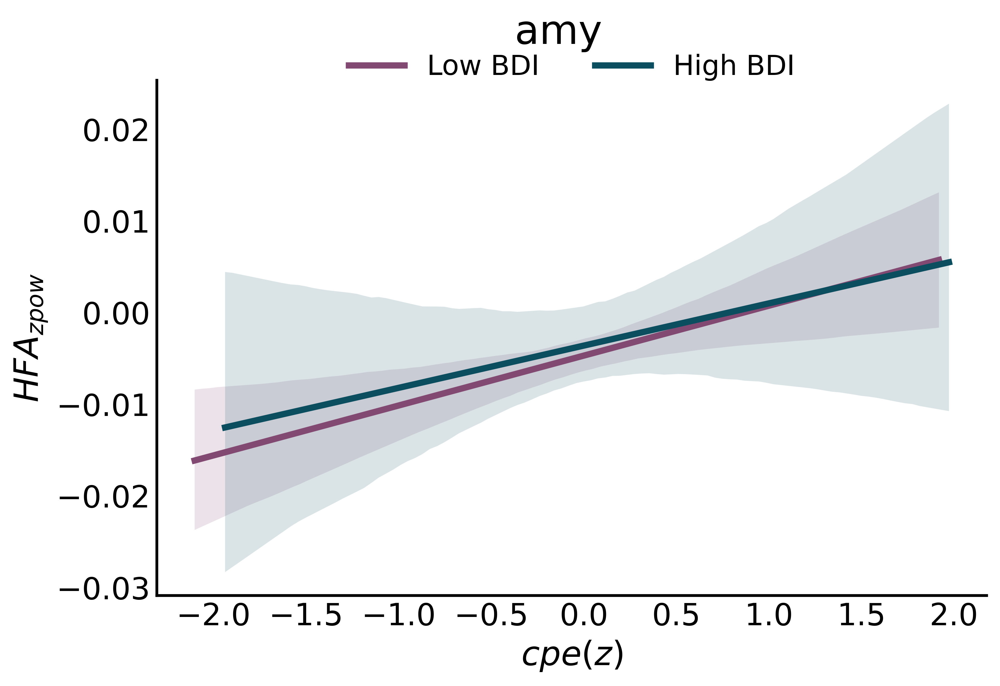

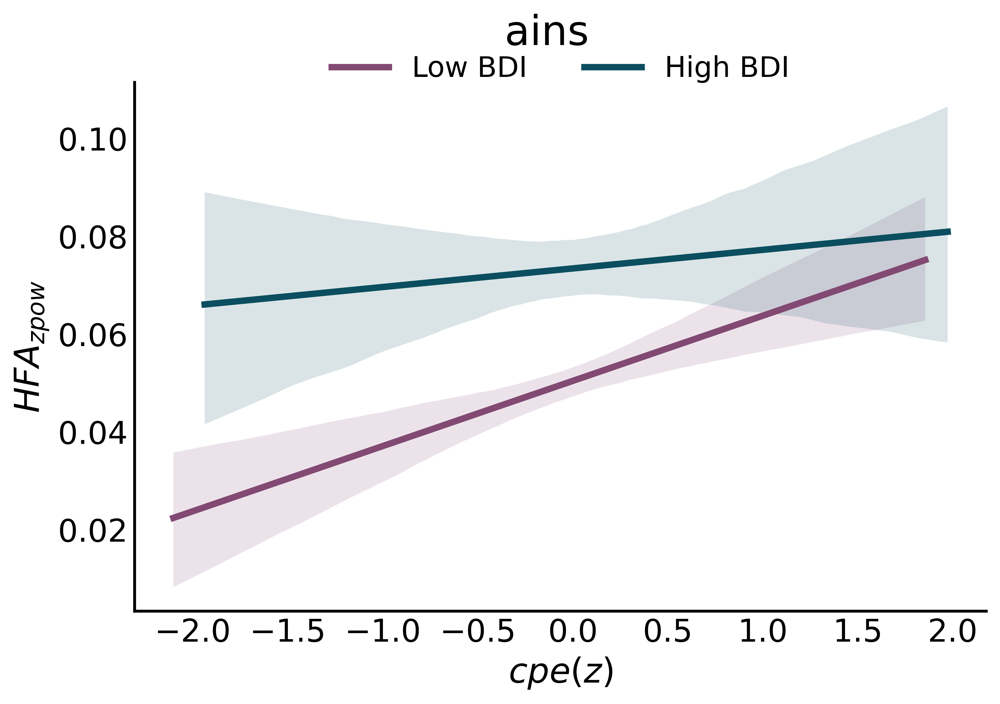

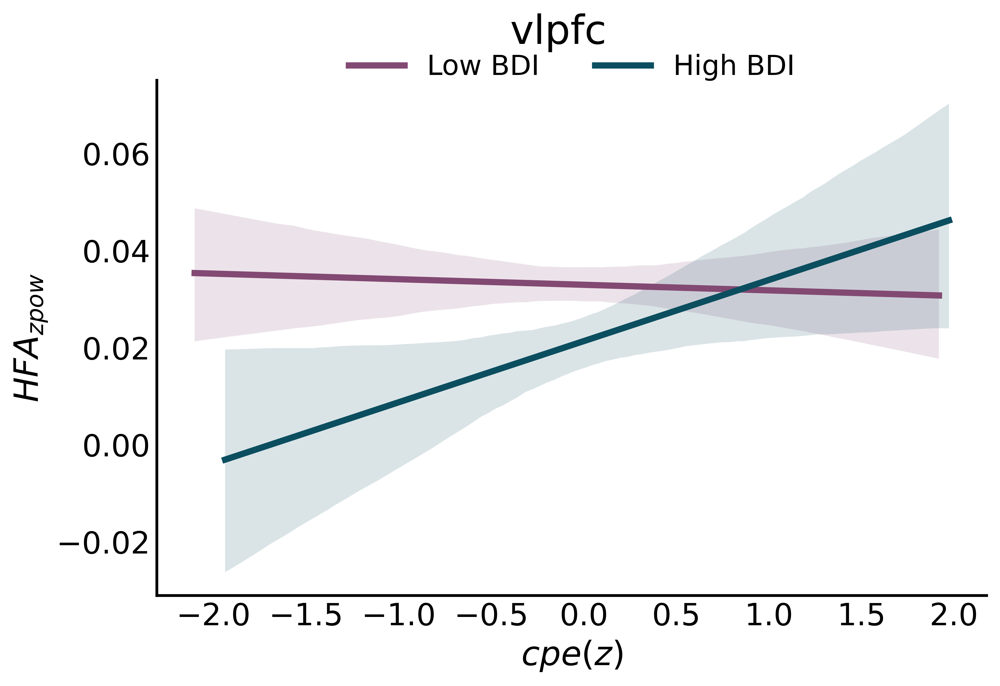

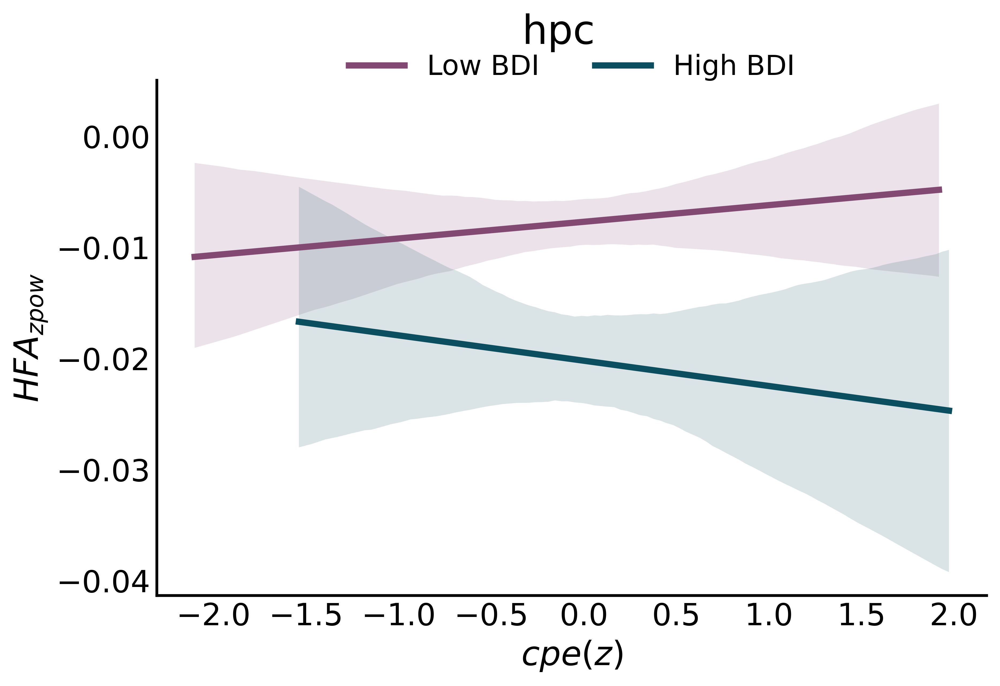

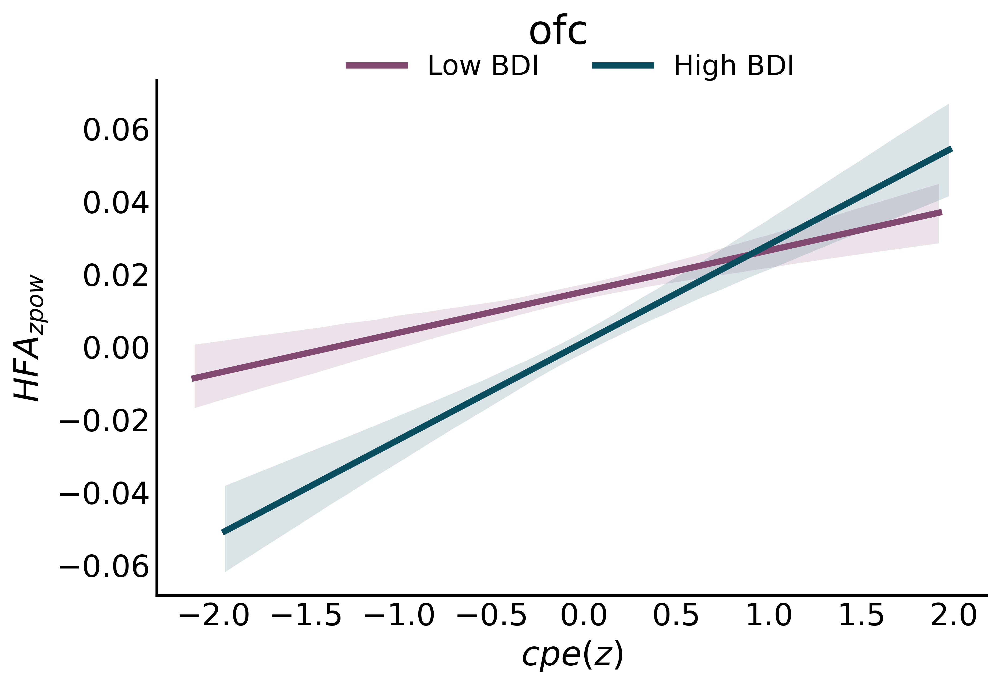

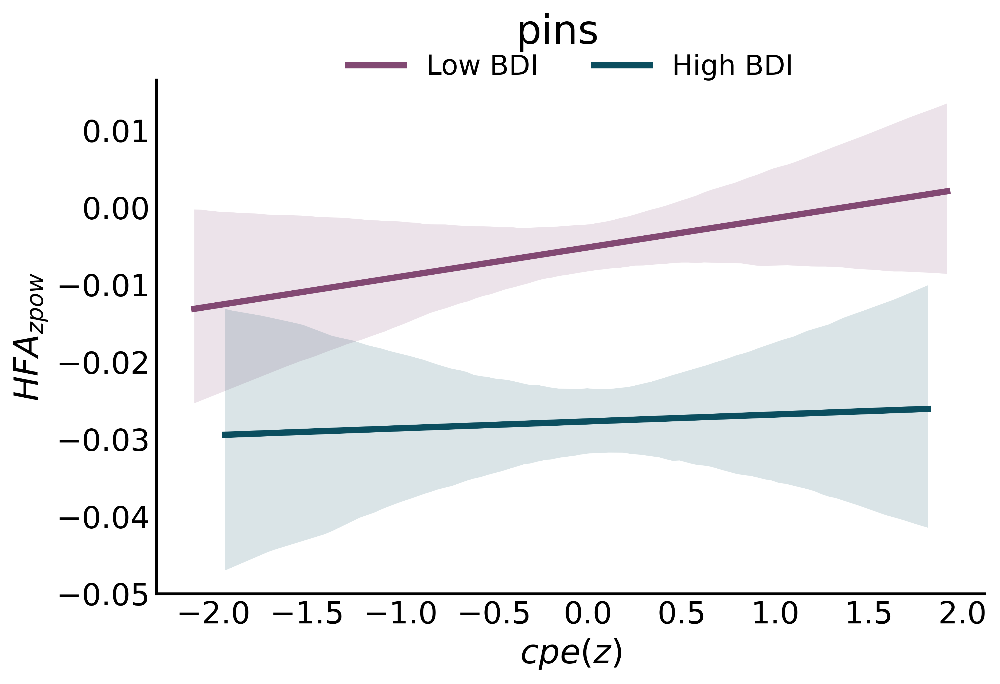

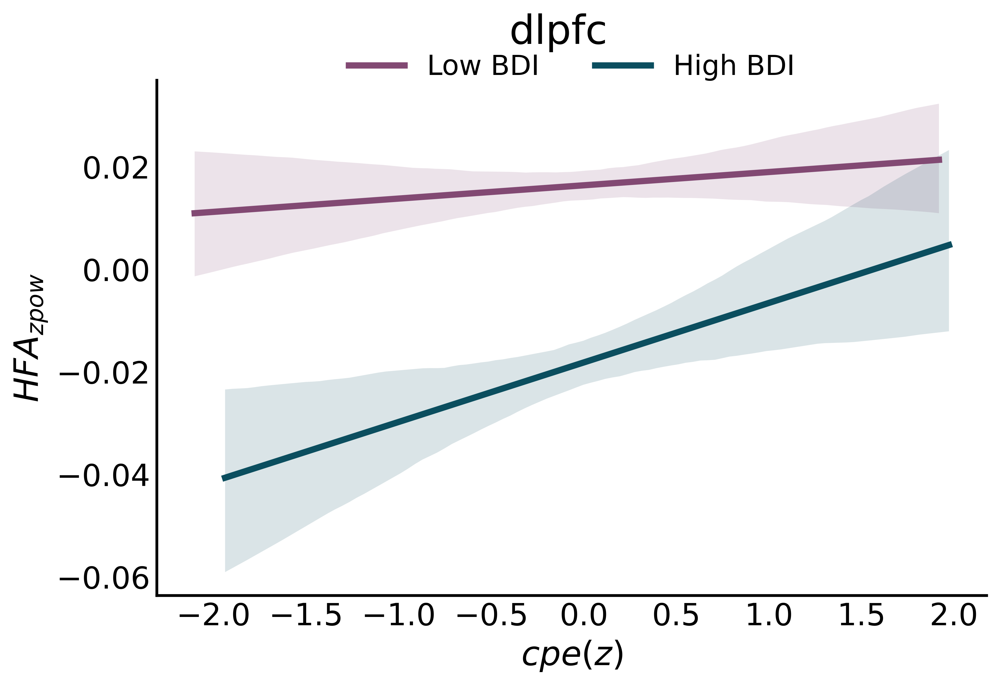

In [29]:
# corr_fig_dir = f'{fig_dir}{band}/{band}_pow_bdi_corr/'
# os.makedirs(corr_fig_dir,exist_ok=True)


# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in hfa_reg_df.roi.unique().tolist():
        
    roi_df = hfa_reg_df[hfa_reg_df.roi==roi]
    
#     fig_id = f'{band}_{roi}_bdi_pow_corr.pdf'

    fig,ax = plt.subplots(figsize=(8,5),dpi=500)



    sns.regplot(data=roi_df[roi_df.bdi_thresh=='low'],x='cpe',y='band_pow',scatter=False,
               ci=95,color = '#824973',label='Low BDI')
    sns.regplot(data=roi_df[roi_df.bdi_thresh=='high'],x='cpe',y='band_pow',scatter=False,
               ci=95,color='#0b4e5f',label='High BDI')

    plt.legend(fontsize=10)
    sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1.1), frameon=False,framealpha=0,
                    fontsize='small',shadow=None,
                    columnspacing=2,ncol=2)


    plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

    plt.ylabel(r'$HFA_{{{zpow}}}$')
    plt.xlabel(r'$cpe(z)$')
    fig.suptitle(roi)
    sns.despine()
    plt.tick_params(length=0)


    # plt.savefig(f'{fig_save_dir}/all_lmplot_cpe_bpow_bdi_{date}.pdf', format='pdf', metadata=None,
    # bbox_inches='tight', pad_inches=0.1,dpi=500,
    # facecolor='auto', edgecolor='auto',
    # backend=None)

# RPE CORR PLOTS

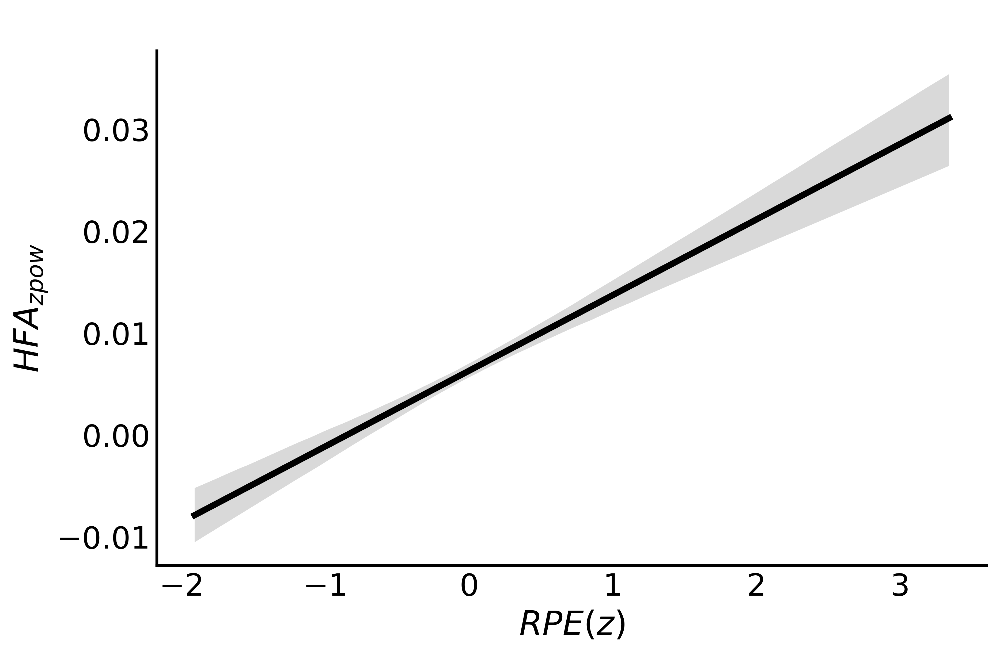

In [34]:
fig,ax = plt.subplots(figsize=(8,5),dpi=500)


sns.regplot(data=hfa_reg_df,x='rpe',y='band_pow',scatter=False,
           ci=95,color = 'k')

plt.legend(fontsize=10)
# borderaxespad=0,frameon=False,framealpha=0,
sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1.1), frameon=False,framealpha=0,
                fontsize='small',shadow=None,
                columnspacing=2,ncol=2)


plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

plt.ylabel(r'$HFA_{{{zpow}}}$')
plt.xlabel(r'$RPE(z)$')
sns.despine()
plt.tick_params(length=0)
# plt.text(7.25,0.07,f'rho: {np.round(r,3)} \n p: {np.round(p_r,6)}',fontsize=16)


# plt.savefig(f'{fig_save_dir}/all_lmplot_cpe_bpow_bdi_{date}.pdf', format='pdf', metadata=None,
# bbox_inches='tight', pad_inches=0.1,dpi=500,
# facecolor='auto', edgecolor='auto',
# backend=None)

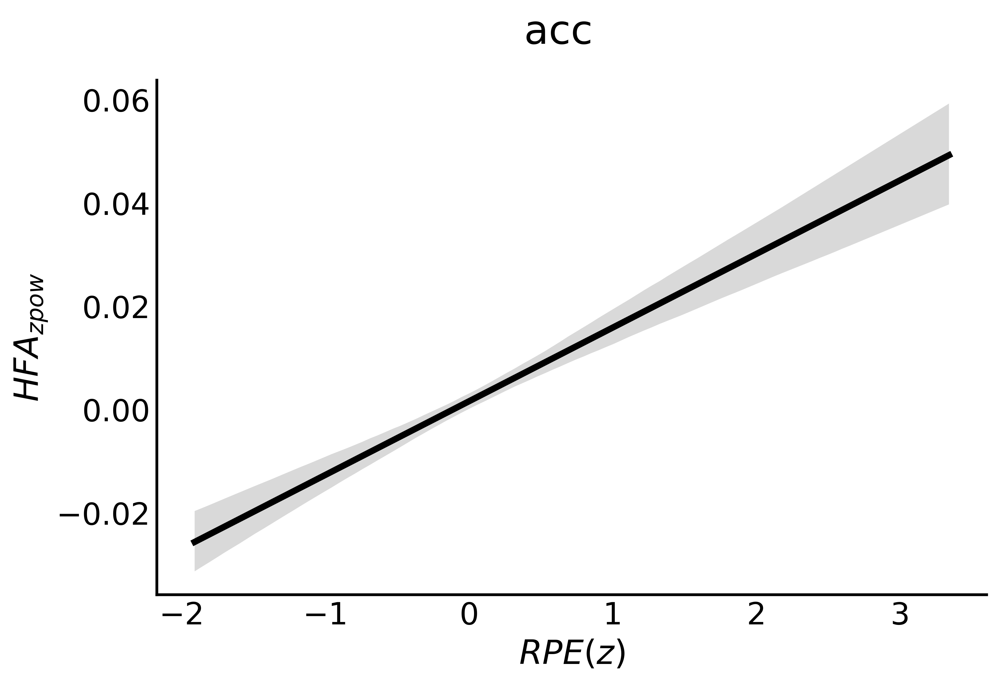

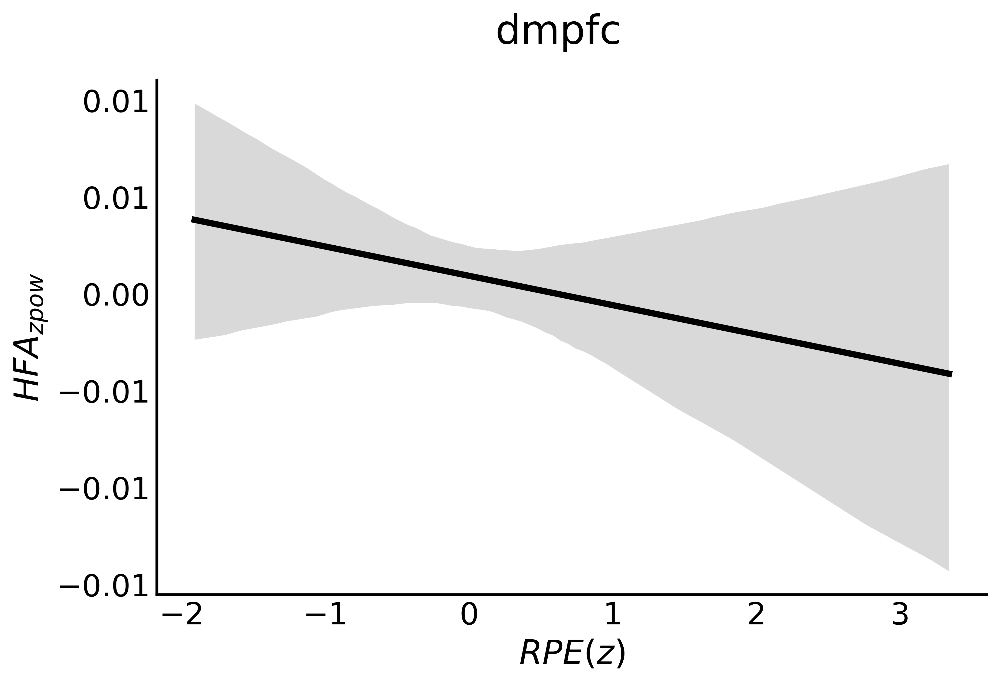

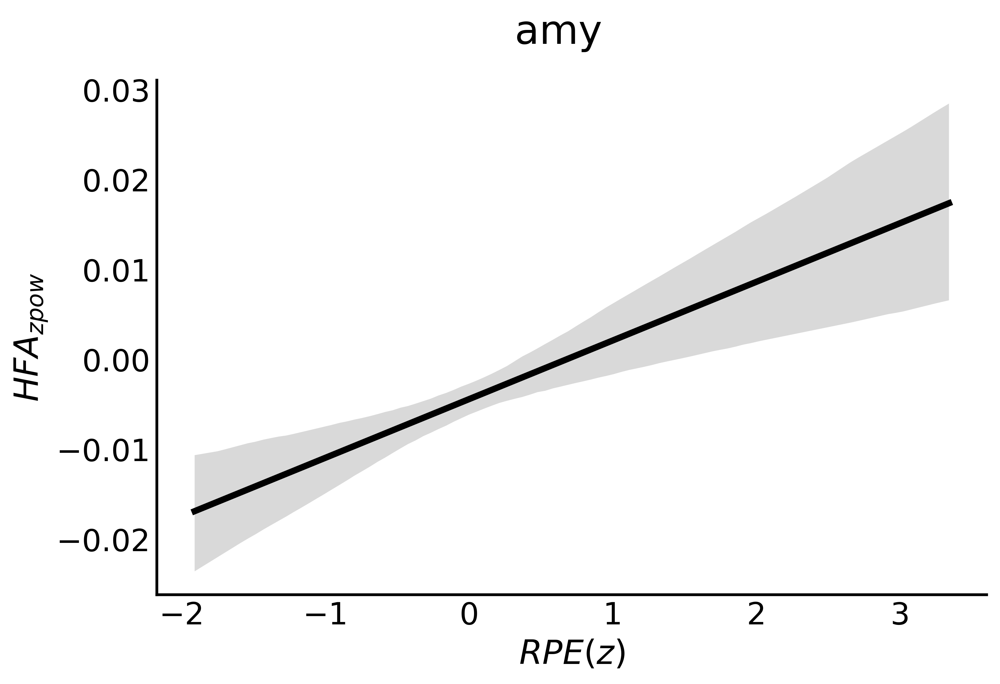

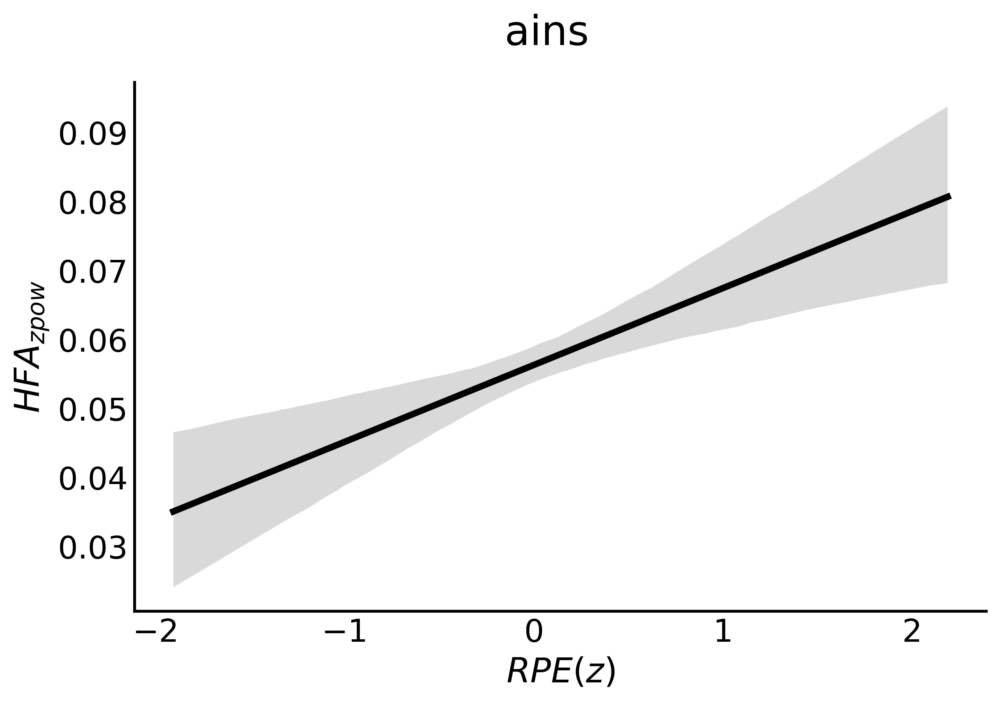

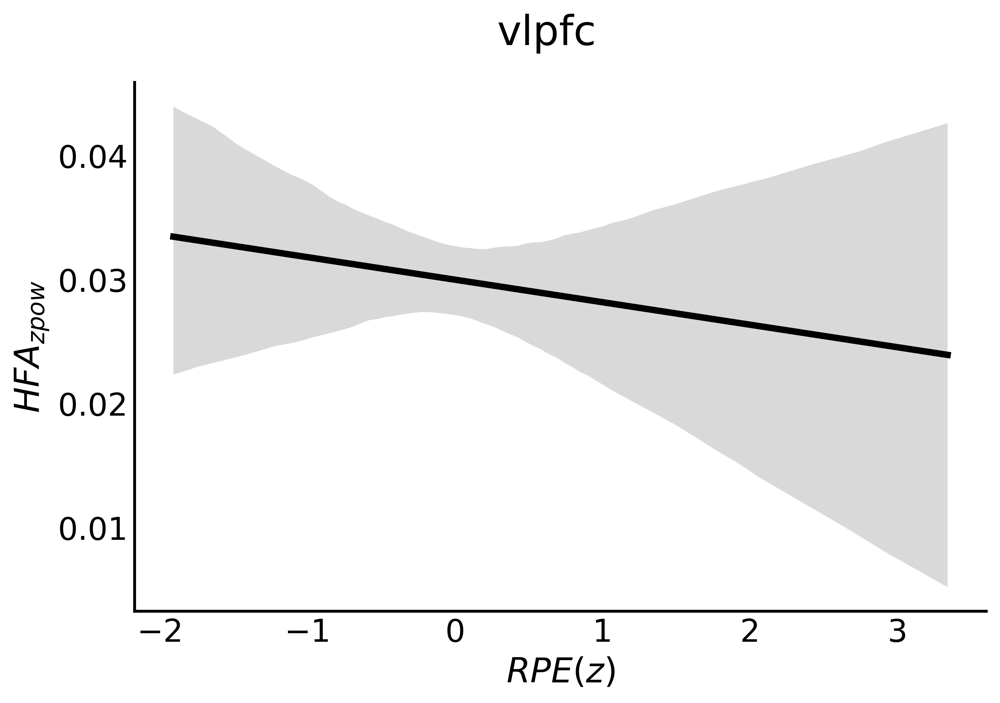

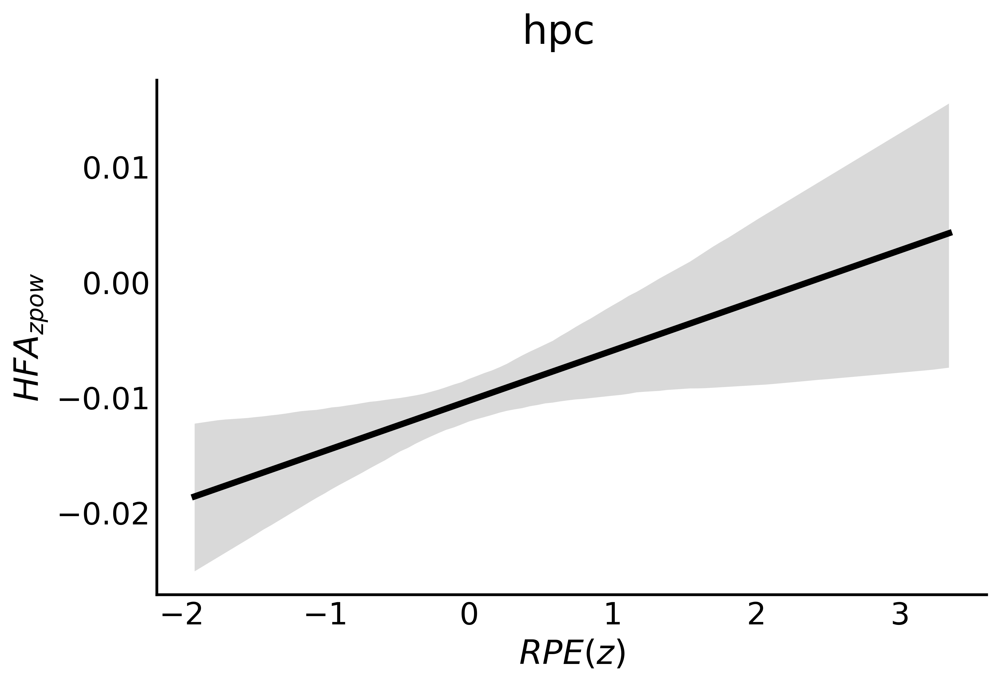

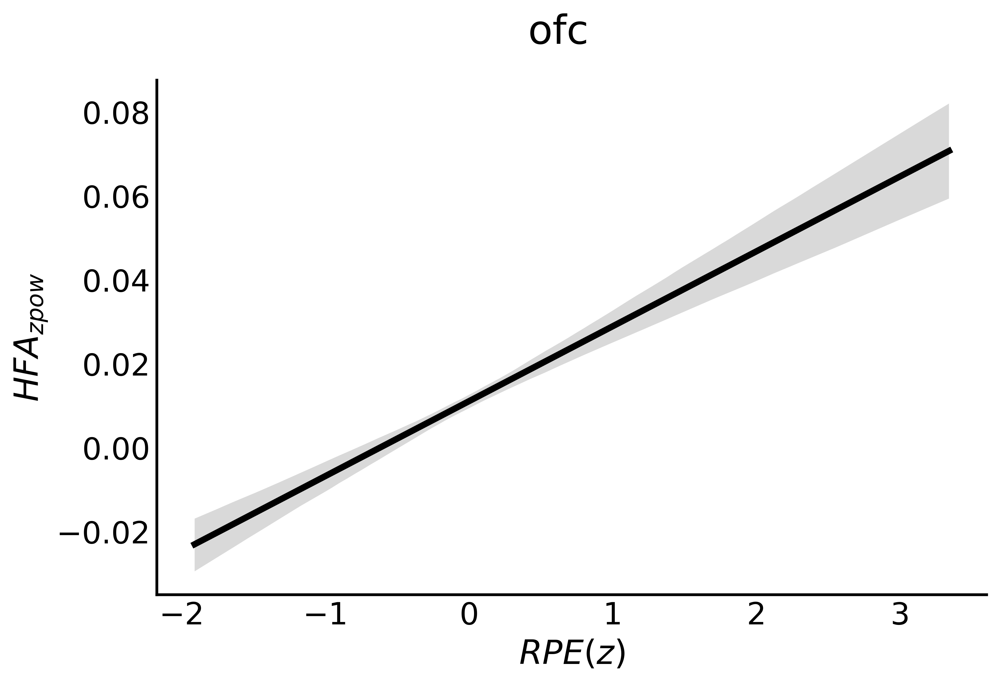

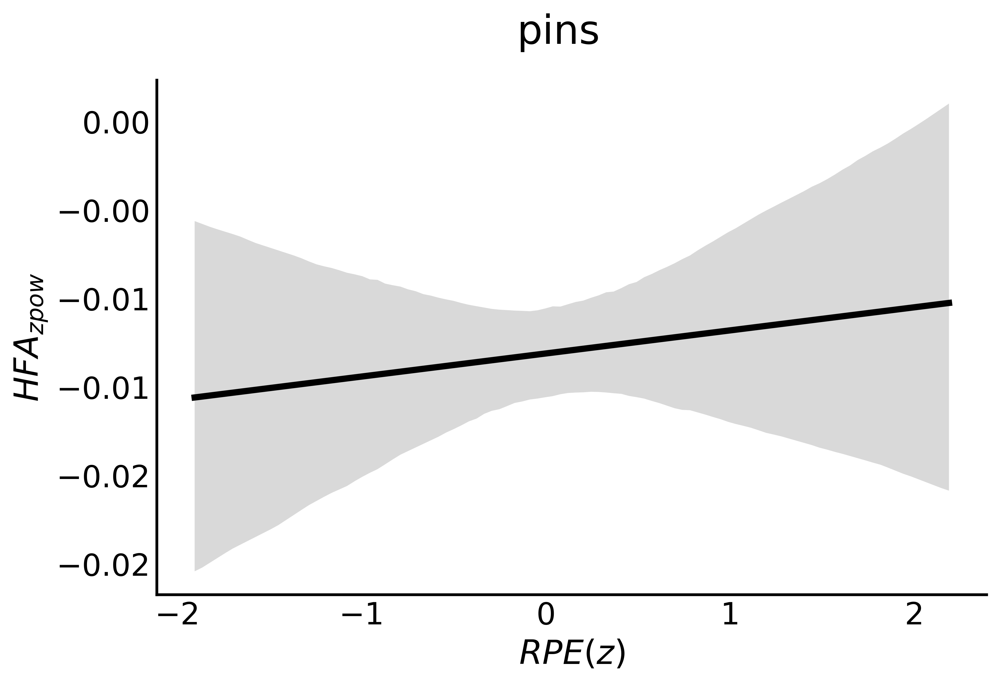

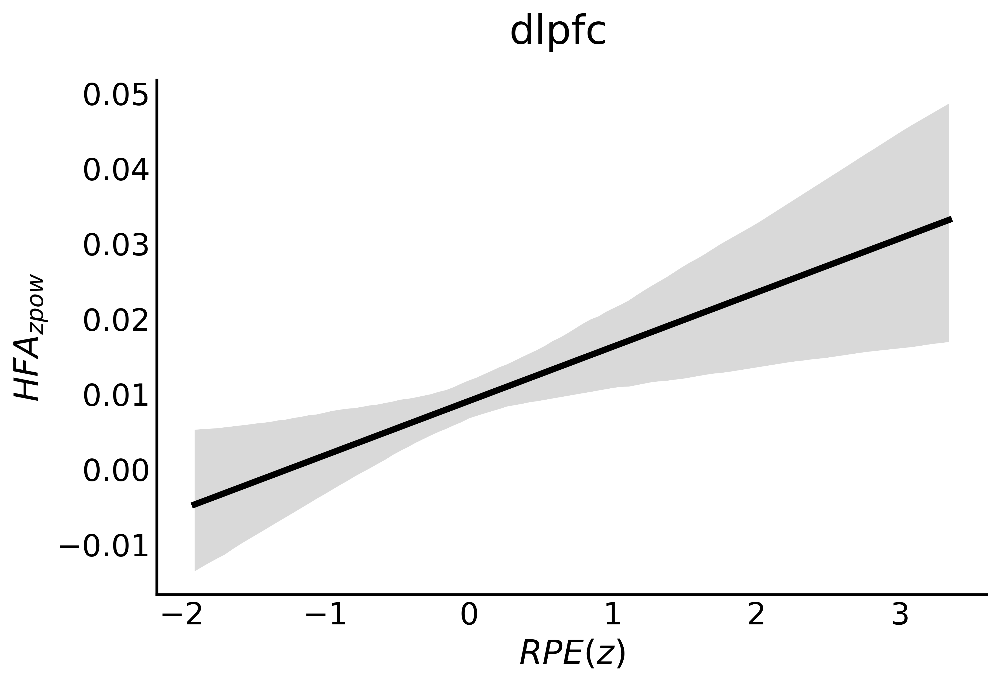

In [31]:
# corr_fig_dir = f'{fig_dir}{band}/{band}_pow_bdi_corr/'
# os.makedirs(corr_fig_dir,exist_ok=True)


# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in hfa_reg_df.roi.unique().tolist():
        
    roi_df = hfa_reg_df[hfa_reg_df.roi==roi]
    
#     fig_id = f'{band}_{roi}_bdi_pow_corr.pdf'

    fig,ax = plt.subplots(figsize=(8,5),dpi=500)


    sns.regplot(data=roi_df,x='rpe',y='band_pow',scatter=False,
               ci=95,color = 'k')

    plt.legend(fontsize=10)
    # borderaxespad=0,frameon=False,framealpha=0,
    sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1.1), frameon=False,framealpha=0,
                    fontsize='small',shadow=None,
                    columnspacing=2,ncol=2)


    plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

    plt.ylabel(r'$HFA_{{{zpow}}}$')
    plt.xlabel(r'$RPE(z)$')
    fig.suptitle(roi)
    sns.despine()
    plt.tick_params(length=0)


    # plt.savefig(f'{fig_save_dir}/all_lmplot_cpe_bpow_bdi_{date}.pdf', format='pdf', metadata=None,
    # bbox_inches='tight', pad_inches=0.1,dpi=500,
    # facecolor='auto', edgecolor='auto',
    # backend=None)

# ROI Band Pow ~ RPE (BDI split)

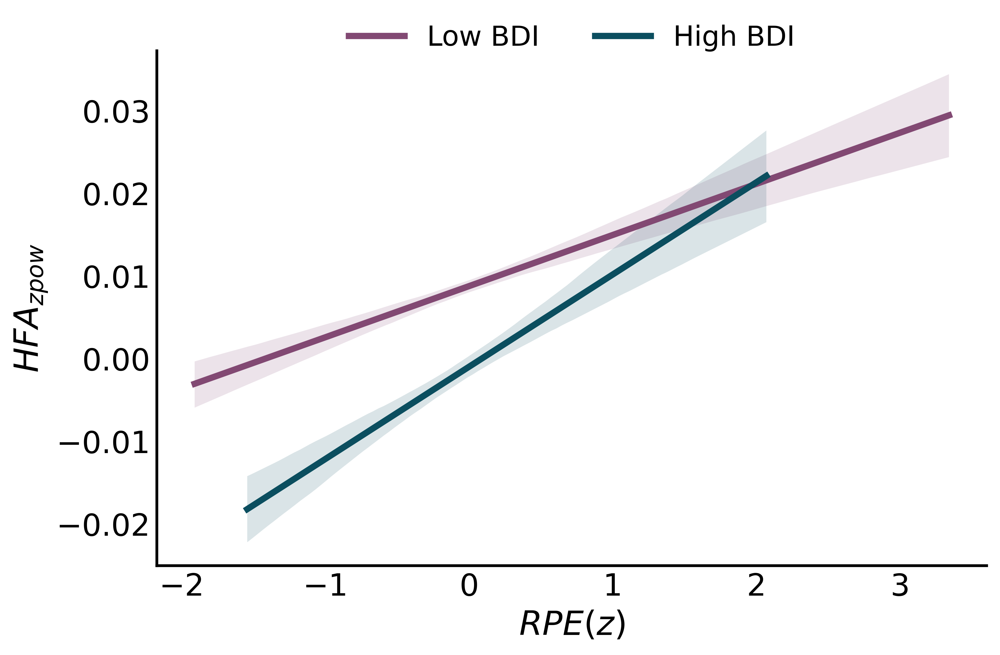

In [32]:
# sns.set_theme(style='ticks') 
# sns.set_context("poster")

# from matplotlib import rc
# rc('text', usetex=False)


fig,ax = plt.subplots(figsize=(8,5),dpi=500)
# sns.set_context("poster",rc={'axes.linewidth': 2})
# sns.set_theme(style='ticks') 

# palette={'depression':"#3f2755",'no depression':"#054a6f"}

palette={'high':"#0b4e5f",'low':"#824973"}


# ax = sns.lmplot(data=beta_reg_df,x='decisionCPE',y='band_pow',hue='Depression',scatter=False,ci=95,palette=palette)
# sns.move_legend(ax, loc='lower center', bbox_to_anchor=(0.1, 1),bbox_to_anchor=(-1, 0), ncol=2)

# sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1), borderaxespad=0.1,frameon=False,framealpha=0,
#                 fontsize='x-small',shadow=None,title=None,columnspacing=0.5,edgecolor=None,markerfirst=True,
#                 markerscale=4,labelcolor=None, ncol=2)


sns.regplot(data=hfa_reg_df[hfa_reg_df.bdi_thresh=='low'],x='rpe',y='band_pow',scatter=False,
           ci=95,color = '#824973',label='Low BDI')
sns.regplot(data=hfa_reg_df[hfa_reg_df.bdi_thresh=='high'],x='rpe',y='band_pow',scatter=False,
           ci=95,color='#0b4e5f',label='High BDI')

plt.legend(fontsize=10)
# borderaxespad=0,frameon=False,framealpha=0,
sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1.1), frameon=False,framealpha=0,
                fontsize='small',shadow=None,
                columnspacing=2,ncol=2)


plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

plt.ylabel(r'$HFA_{{{zpow}}}$')
plt.xlabel(r'$RPE(z)$')
sns.despine()
plt.tick_params(length=0)
# plt.text(7.25,0.07,f'rho: {np.round(r,3)} \n p: {np.round(p_r,6)}',fontsize=16)


# plt.savefig(f'{fig_save_dir}/all_lmplot_cpe_bpow_bdi_{date}.pdf', format='pdf', metadata=None,
# bbox_inches='tight', pad_inches=0.1,dpi=500,
# facecolor='auto', edgecolor='auto',
# backend=None)

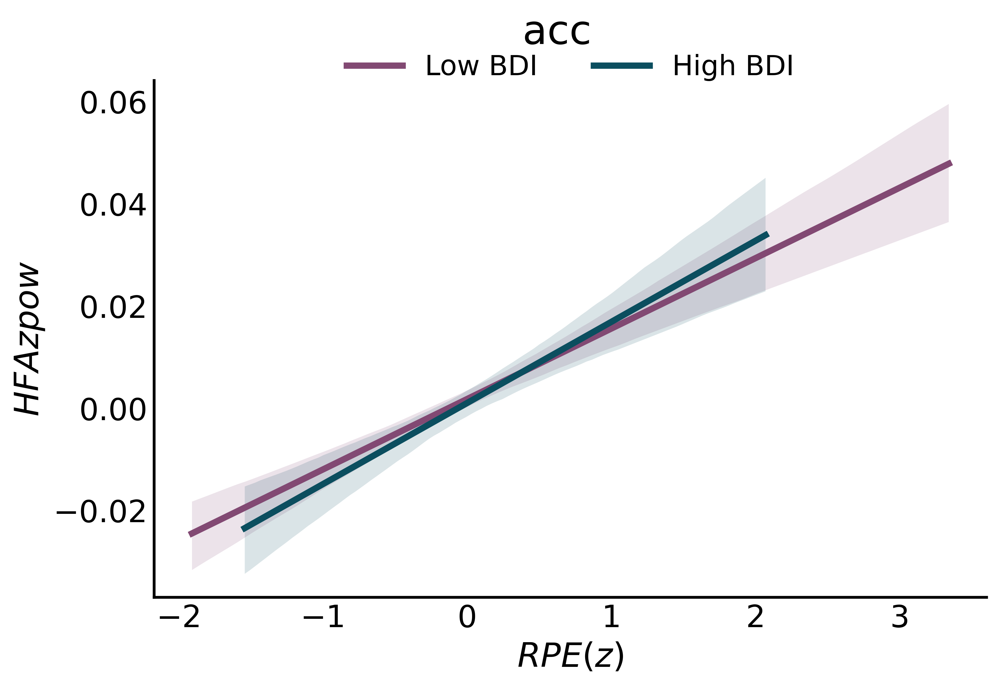

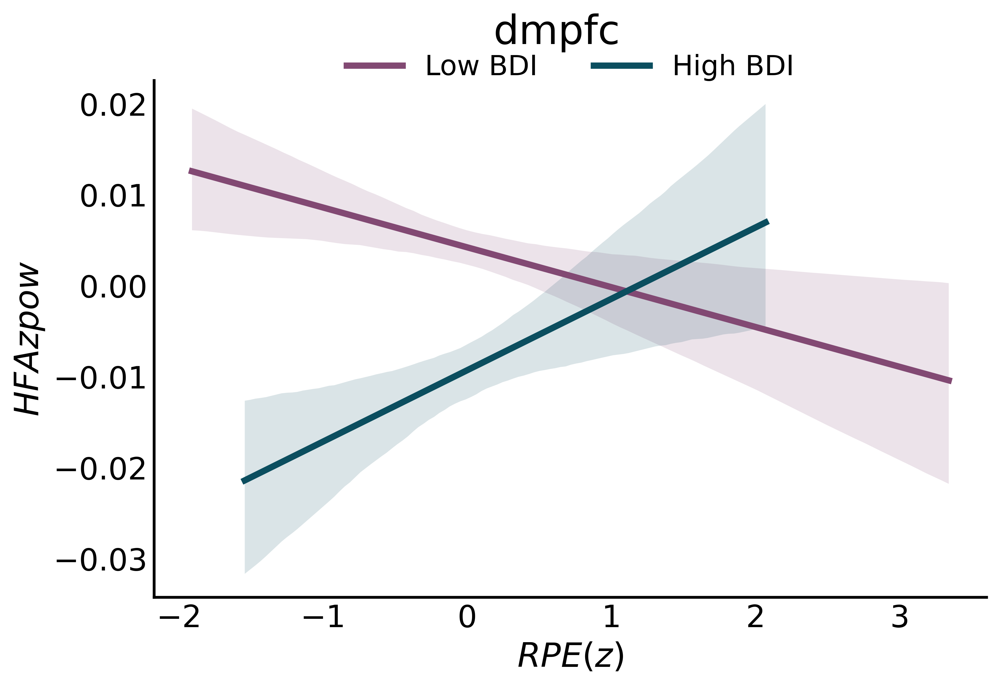

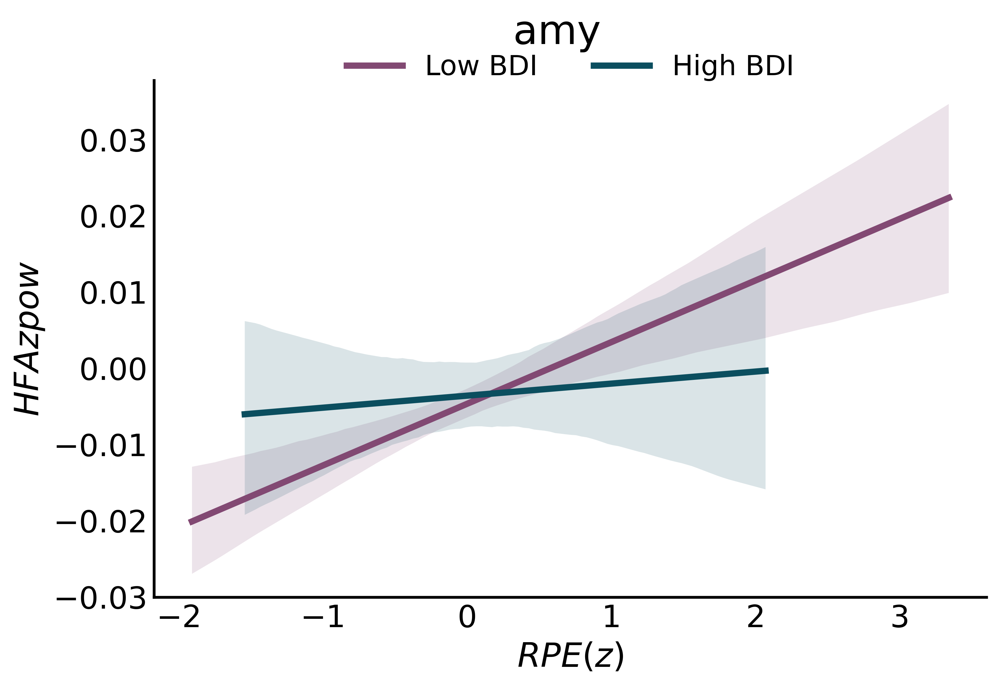

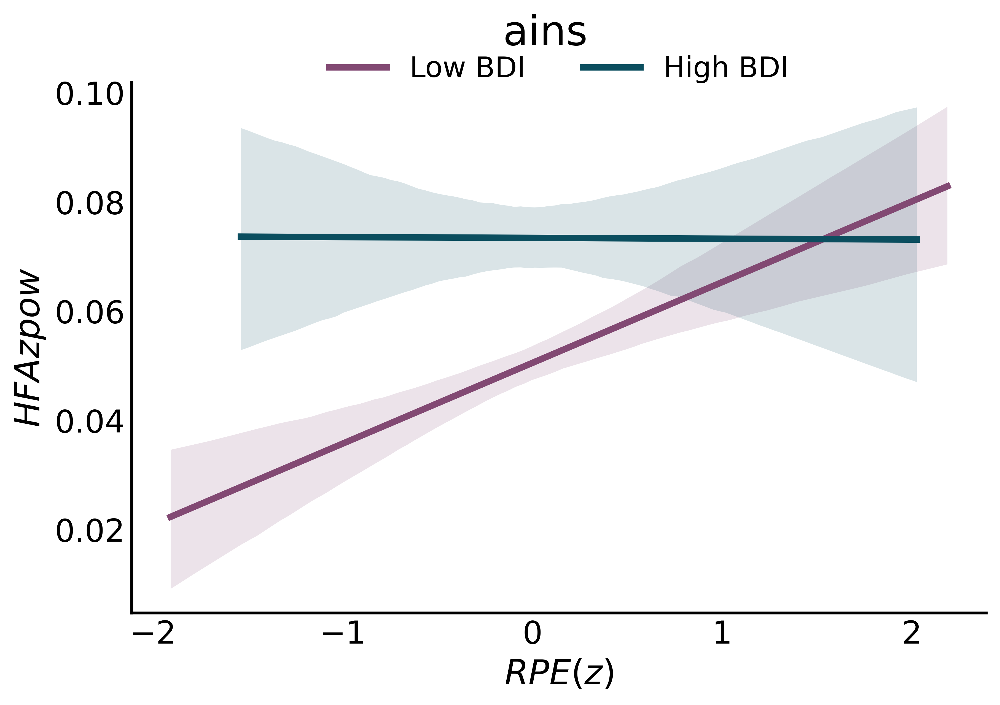

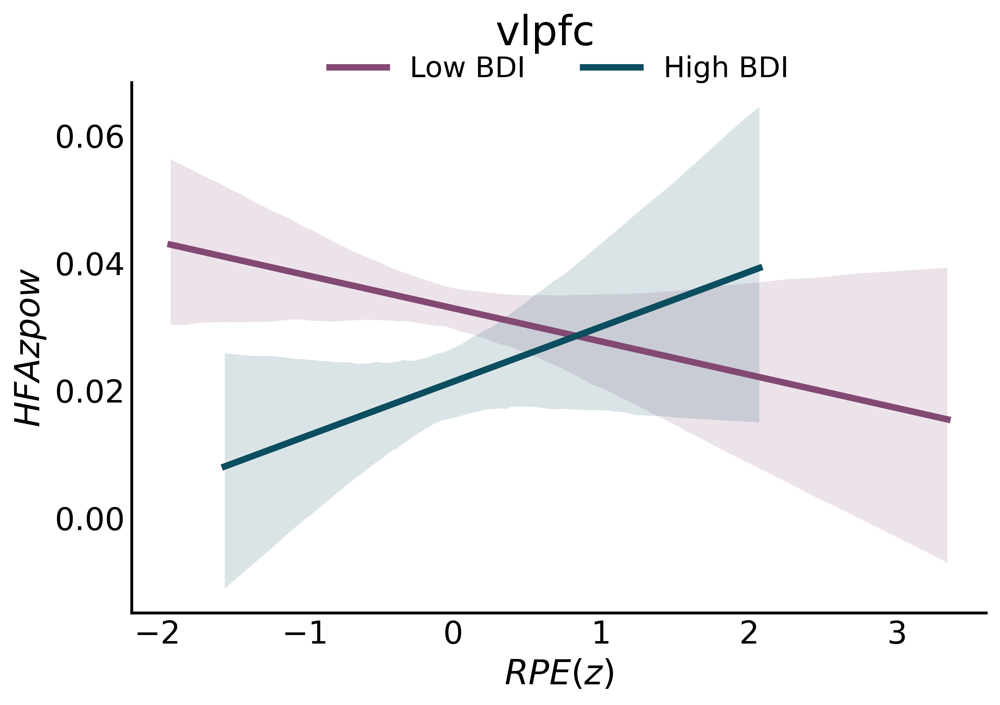

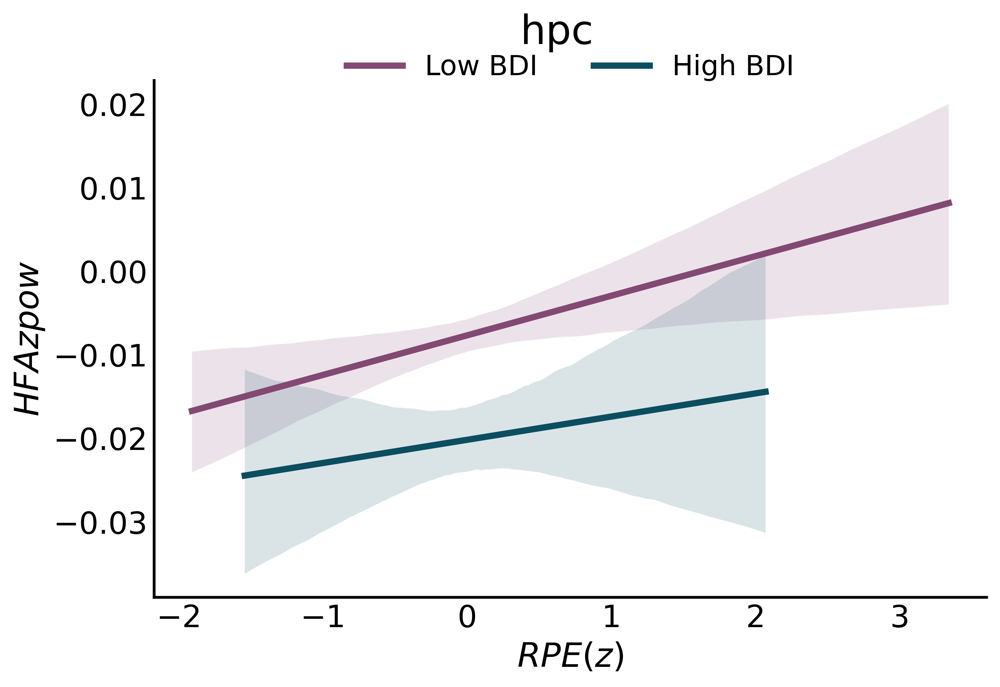

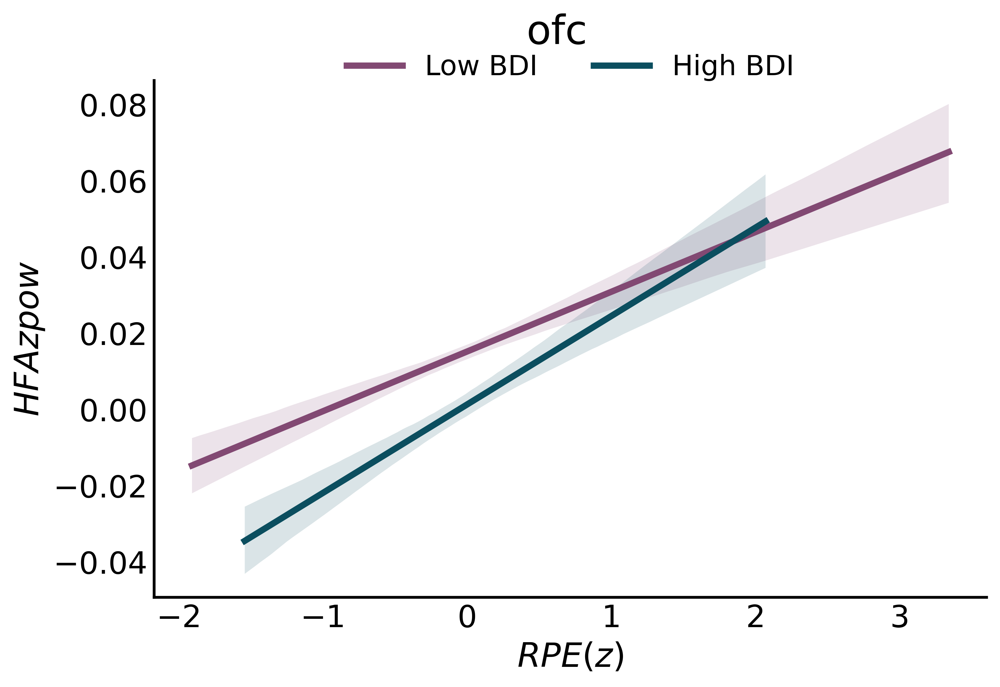

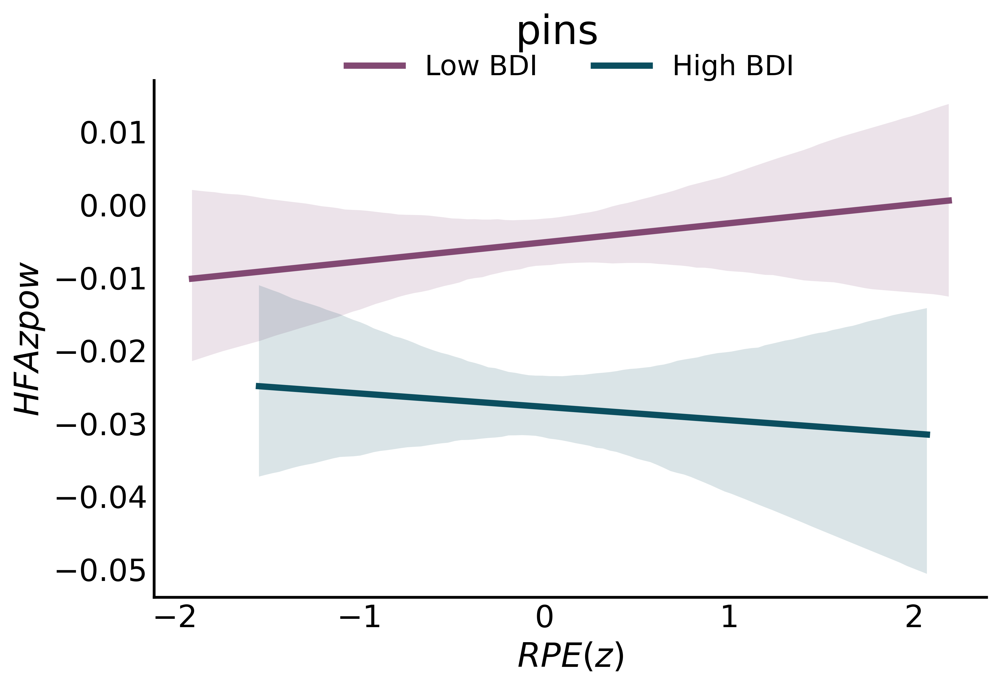

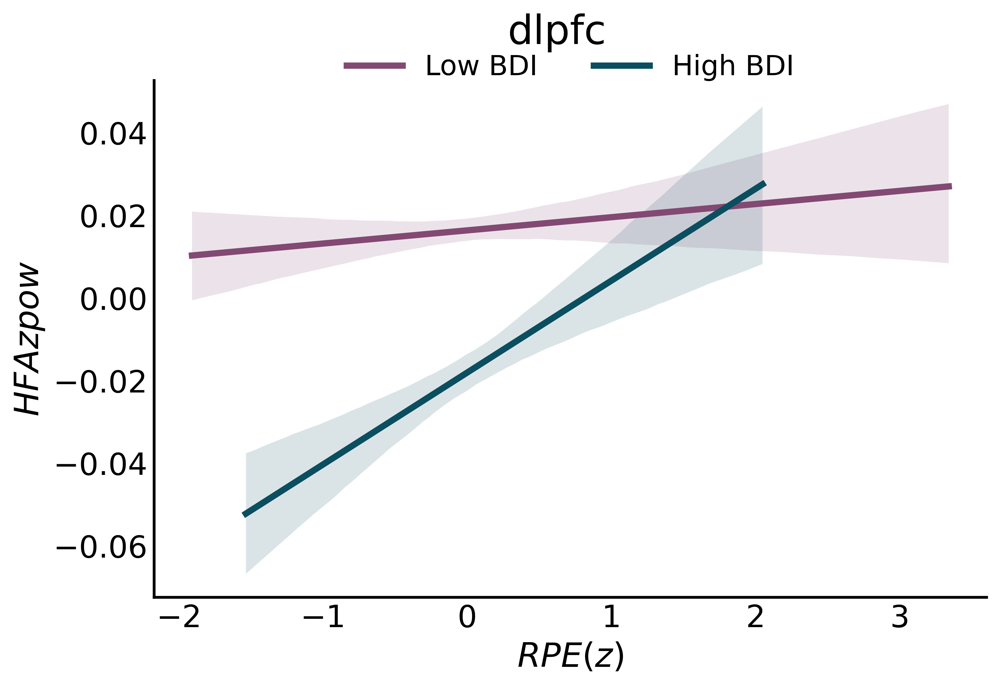

In [33]:
# corr_fig_dir = f'{fig_dir}{band}/{band}_pow_bdi_corr/'
# os.makedirs(corr_fig_dir,exist_ok=True)


# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in hfa_reg_df.roi.unique().tolist():
        
    roi_df = hfa_reg_df[hfa_reg_df.roi==roi]
    
#     fig_id = f'{band}_{roi}_bdi_pow_corr.pdf'

    fig,ax = plt.subplots(figsize=(8,5),dpi=500)



    sns.regplot(data=roi_df[roi_df.bdi_thresh=='low'],x='rpe',y='band_pow',scatter=False,
               ci=95,color = '#824973',label='Low BDI')
    sns.regplot(data=roi_df[roi_df.bdi_thresh=='high'],x='rpe',y='band_pow',scatter=False,
               ci=95,color='#0b4e5f',label='High BDI')

    plt.legend(fontsize=10)
    sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1.1), frameon=False,framealpha=0,
                    fontsize='small',shadow=None,
                    columnspacing=2,ncol=2)


    plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

    plt.ylabel(r'$HFA{{{zpow}}}$')
    plt.xlabel(r'$RPE(z)$')
    fig.suptitle(roi)
    sns.despine()
    plt.tick_params(length=0)


    # plt.savefig(f'{fig_save_dir}/all_lmplot_cpe_bpow_bdi_{date}.pdf', format='pdf', metadata=None,
    # bbox_inches='tight', pad_inches=0.1,dpi=500,
    # facecolor='auto', edgecolor='auto',
    # backend=None)

# PROFIT CORR PLOTS

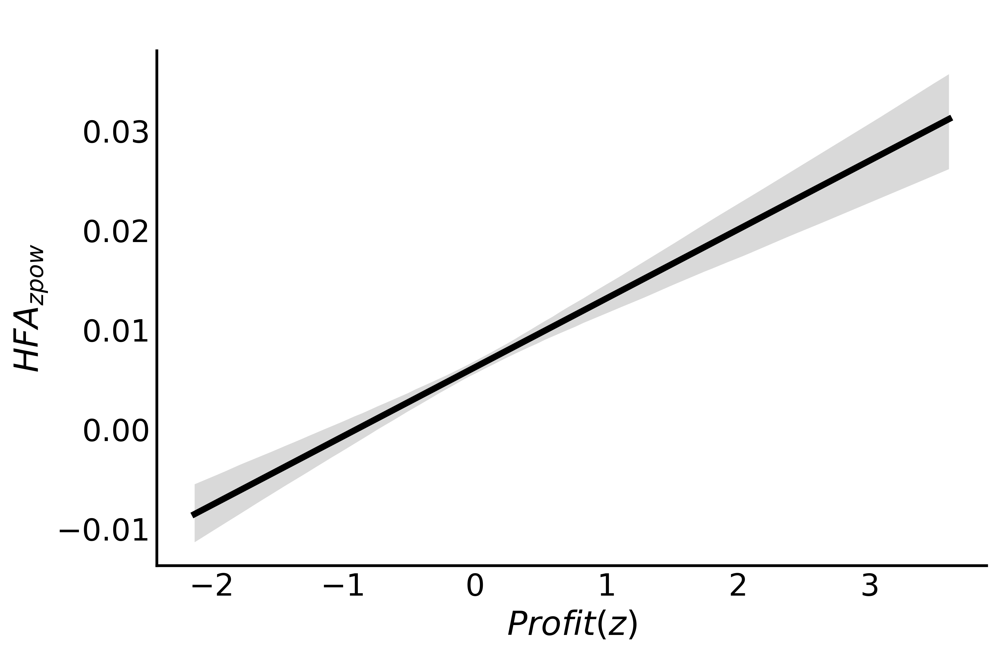

In [35]:
fig,ax = plt.subplots(figsize=(8,5),dpi=500)


sns.regplot(data=hfa_reg_df,x='Profit',y='band_pow',scatter=False,
           ci=95,color = 'k')

plt.legend(fontsize=10)
# borderaxespad=0,frameon=False,framealpha=0,
sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1.1), frameon=False,framealpha=0,
                fontsize='small',shadow=None,
                columnspacing=2,ncol=2)


plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

plt.ylabel(r'$HFA_{{{zpow}}}$')
plt.xlabel(r'$Profit(z)$')
sns.despine()
plt.tick_params(length=0)
# plt.text(7.25,0.07,f'rho: {np.round(r,3)} \n p: {np.round(p_r,6)}',fontsize=16)


# plt.savefig(f'{fig_save_dir}/all_lmplot_cpe_bpow_bdi_{date}.pdf', format='pdf', metadata=None,
# bbox_inches='tight', pad_inches=0.1,dpi=500,
# facecolor='auto', edgecolor='auto',
# backend=None)

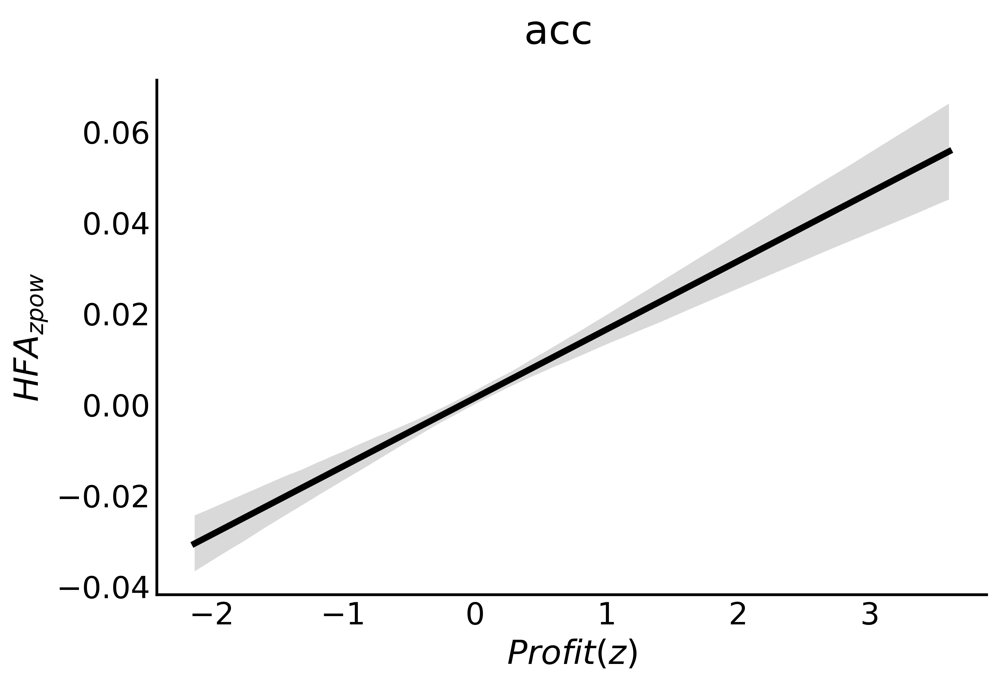

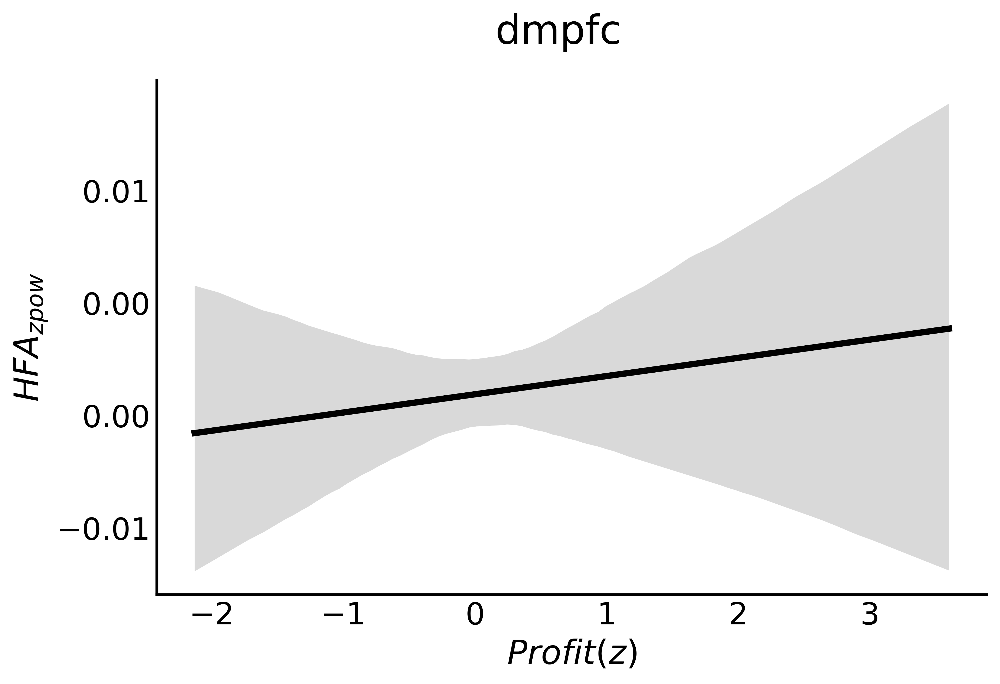

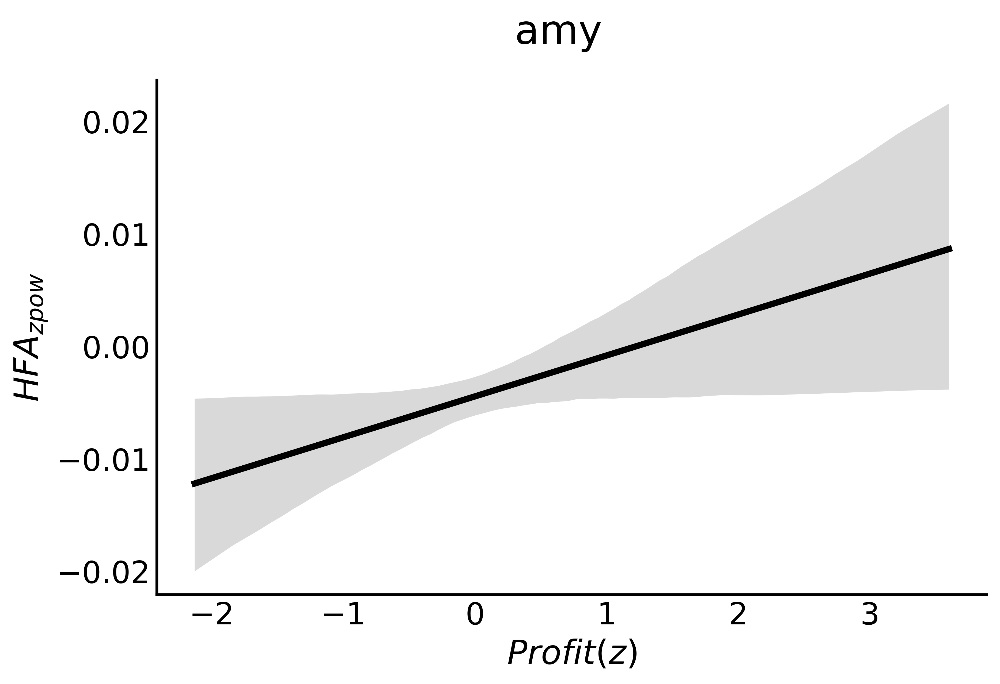

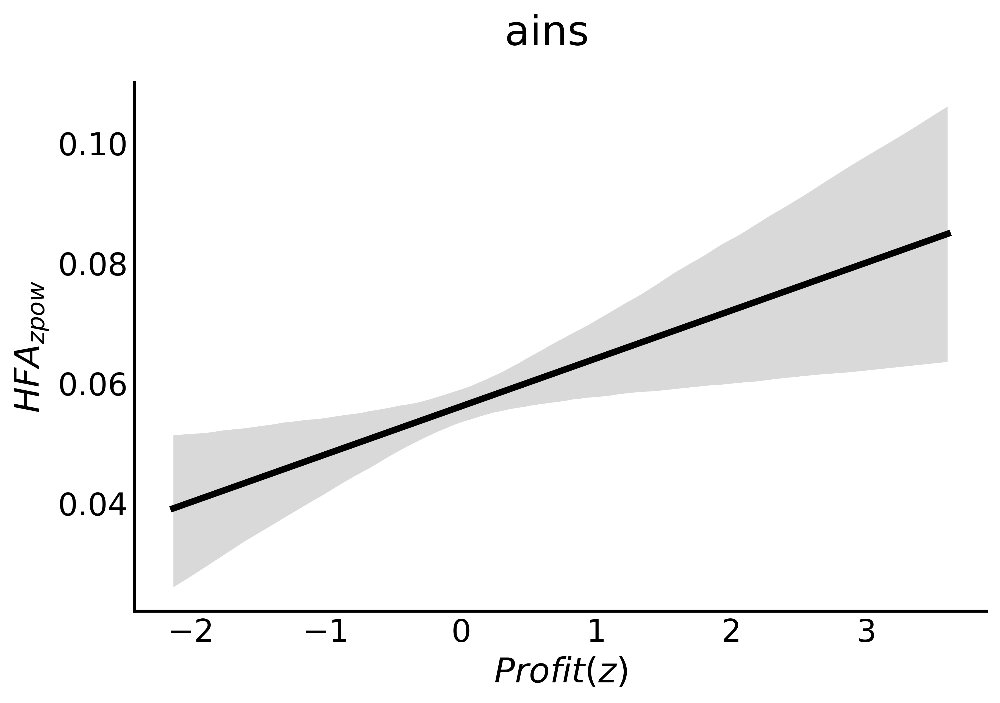

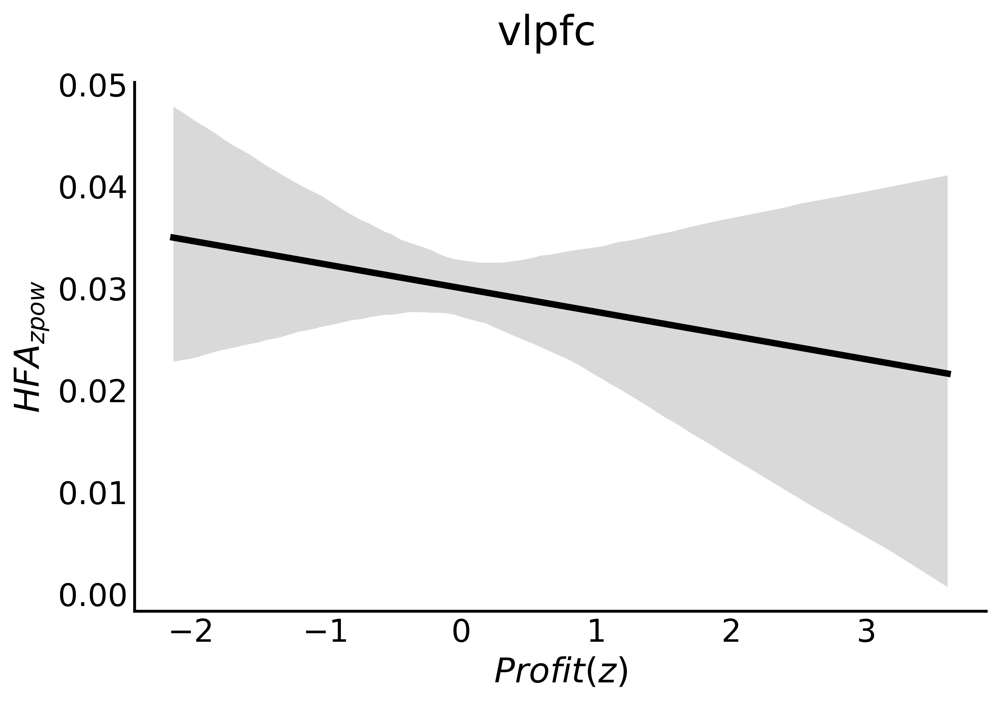

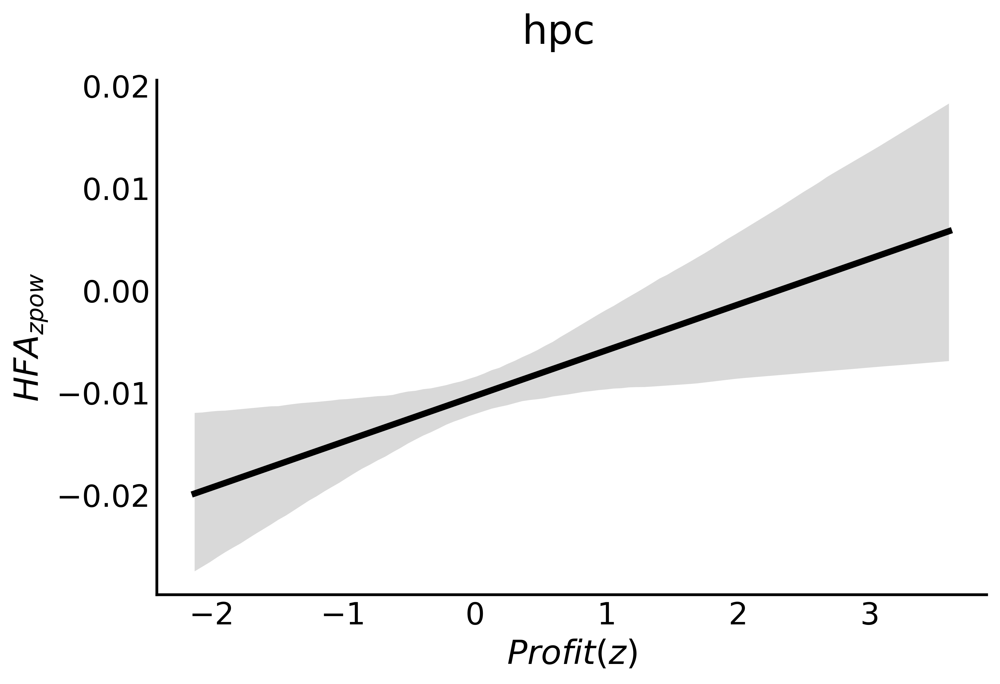

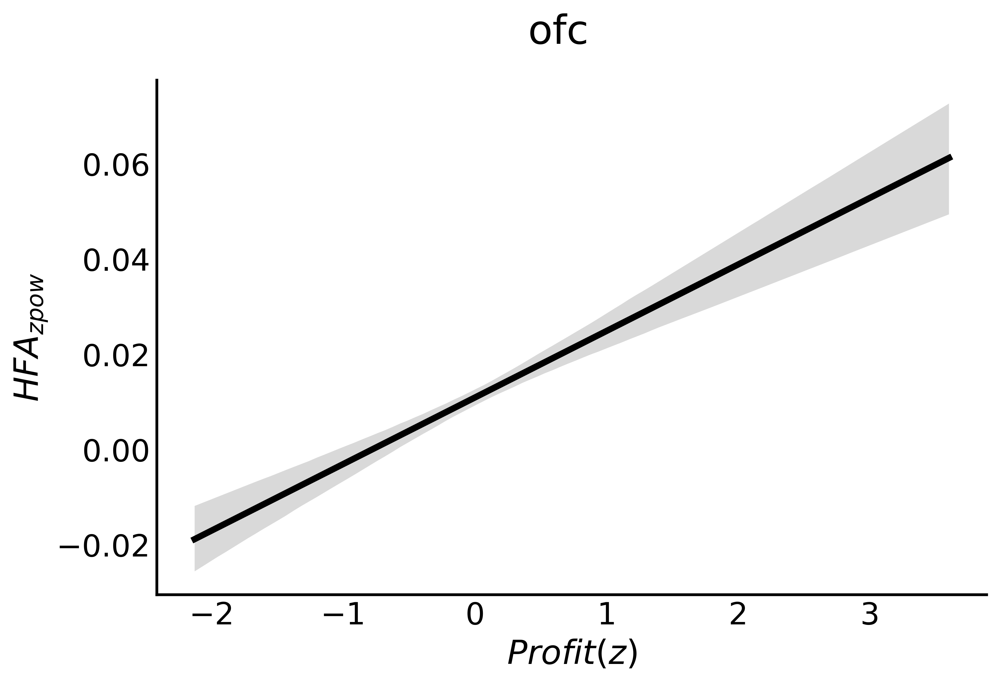

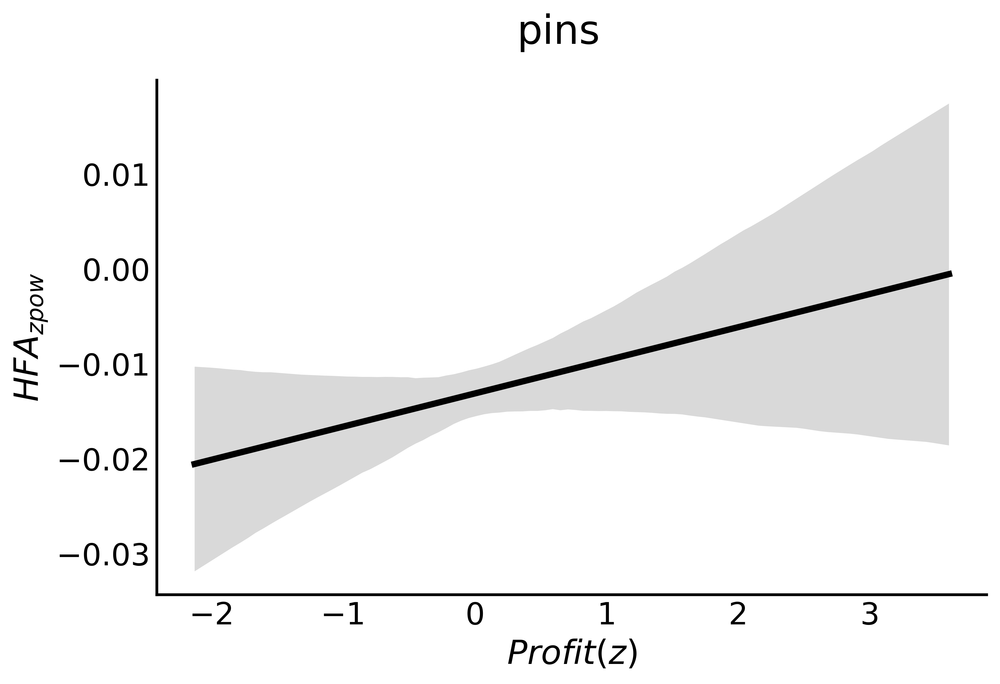

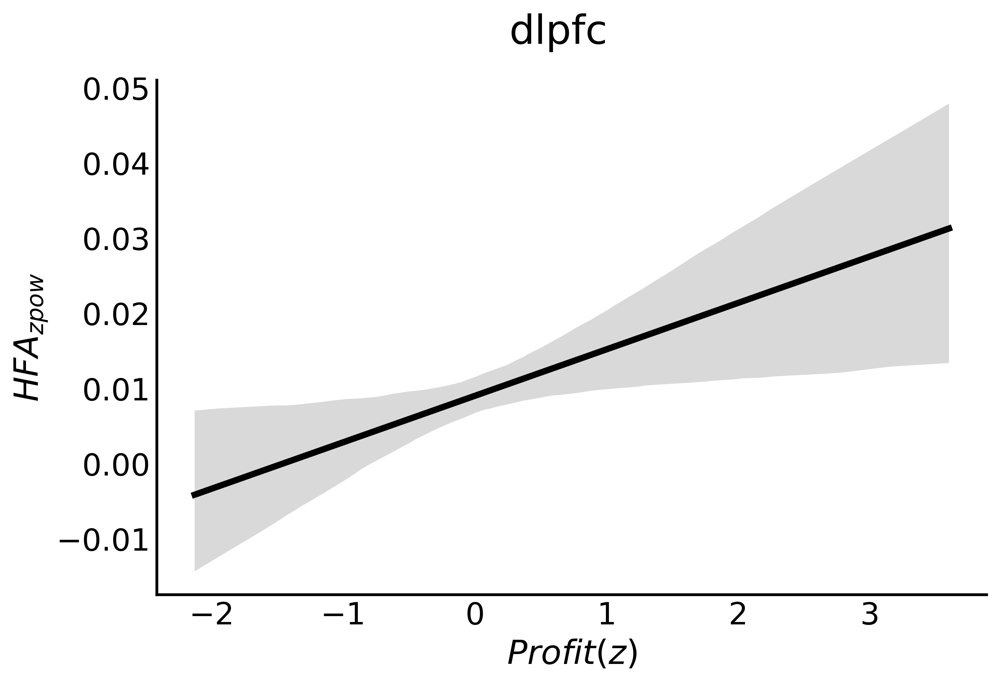

In [36]:
# corr_fig_dir = f'{fig_dir}{band}/{band}_pow_bdi_corr/'
# os.makedirs(corr_fig_dir,exist_ok=True)


# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in hfa_reg_df.roi.unique().tolist():
        
    roi_df = hfa_reg_df[hfa_reg_df.roi==roi]
    
#     fig_id = f'{band}_{roi}_bdi_pow_corr.pdf'

    fig,ax = plt.subplots(figsize=(8,5),dpi=500)


    sns.regplot(data=roi_df,x='Profit',y='band_pow',scatter=False,
               ci=95,color = 'k')

    plt.legend(fontsize=10)
    # borderaxespad=0,frameon=False,framealpha=0,
    sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1.1), frameon=False,framealpha=0,
                    fontsize='small',shadow=None,
                    columnspacing=2,ncol=2)


    plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

    plt.ylabel(r'$HFA_{{{zpow}}}$')
    plt.xlabel(r'$Profit(z)$')
    fig.suptitle(roi)
    sns.despine()
    plt.tick_params(length=0)


    # plt.savefig(f'{fig_save_dir}/all_lmplot_cpe_bpow_bdi_{date}.pdf', format='pdf', metadata=None,
    # bbox_inches='tight', pad_inches=0.1,dpi=500,
    # facecolor='auto', edgecolor='auto',
    # backend=None)

# ROI Band Pow ~ RPE (BDI split)

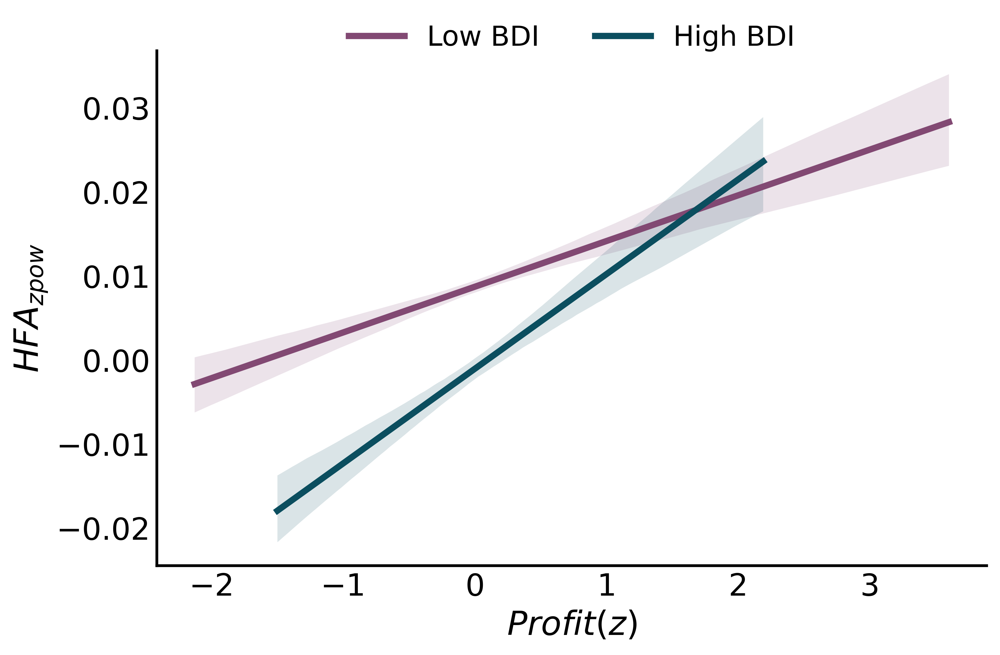

In [37]:
# sns.set_theme(style='ticks') 
# sns.set_context("poster")

# from matplotlib import rc
# rc('text', usetex=False)


fig,ax = plt.subplots(figsize=(8,5),dpi=500)
# sns.set_context("poster",rc={'axes.linewidth': 2})
# sns.set_theme(style='ticks') 

# palette={'depression':"#3f2755",'no depression':"#054a6f"}

palette={'high':"#0b4e5f",'low':"#824973"}


# ax = sns.lmplot(data=beta_reg_df,x='decisionCPE',y='band_pow',hue='Depression',scatter=False,ci=95,palette=palette)
# sns.move_legend(ax, loc='lower center', bbox_to_anchor=(0.1, 1),bbox_to_anchor=(-1, 0), ncol=2)

# sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1), borderaxespad=0.1,frameon=False,framealpha=0,
#                 fontsize='x-small',shadow=None,title=None,columnspacing=0.5,edgecolor=None,markerfirst=True,
#                 markerscale=4,labelcolor=None, ncol=2)


sns.regplot(data=hfa_reg_df[hfa_reg_df.bdi_thresh=='low'],x='Profit',y='band_pow',scatter=False,
           ci=95,color = '#824973',label='Low BDI')
sns.regplot(data=hfa_reg_df[hfa_reg_df.bdi_thresh=='high'],x='Profit',y='band_pow',scatter=False,
           ci=95,color='#0b4e5f',label='High BDI')

plt.legend(fontsize=10)
# borderaxespad=0,frameon=False,framealpha=0,
sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1.1), frameon=False,framealpha=0,
                fontsize='small',shadow=None,
                columnspacing=2,ncol=2)


plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

plt.ylabel(r'$HFA_{{{zpow}}}$')
plt.xlabel(r'$Profit(z)$')
sns.despine()
plt.tick_params(length=0)
# plt.text(7.25,0.07,f'rho: {np.round(r,3)} \n p: {np.round(p_r,6)}',fontsize=16)


# plt.savefig(f'{fig_save_dir}/all_lmplot_cpe_bpow_bdi_{date}.pdf', format='pdf', metadata=None,
# bbox_inches='tight', pad_inches=0.1,dpi=500,
# facecolor='auto', edgecolor='auto',
# backend=None)

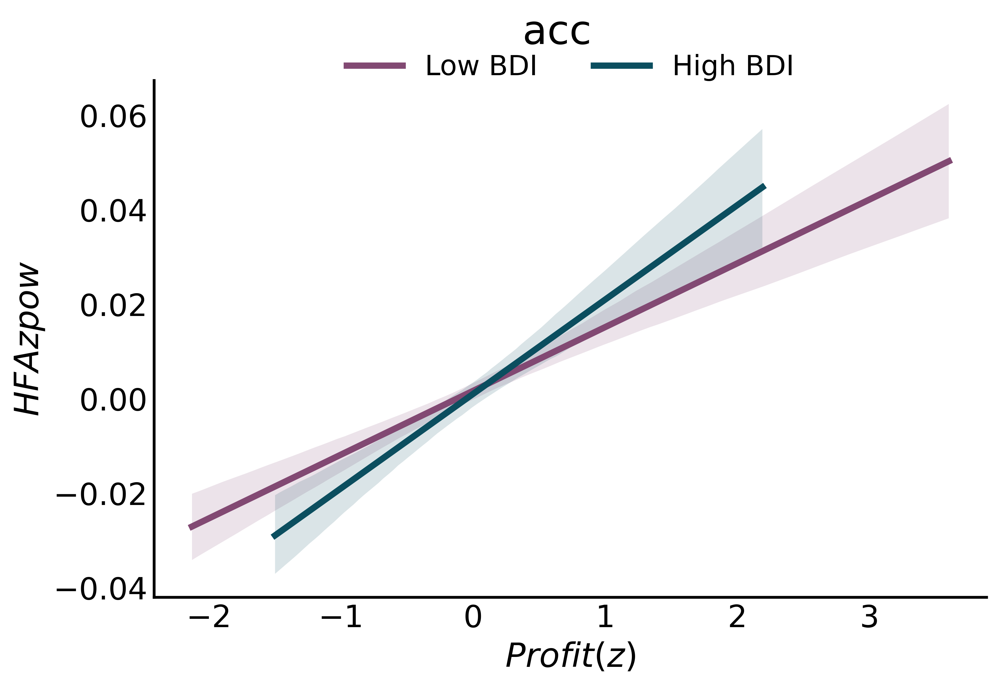

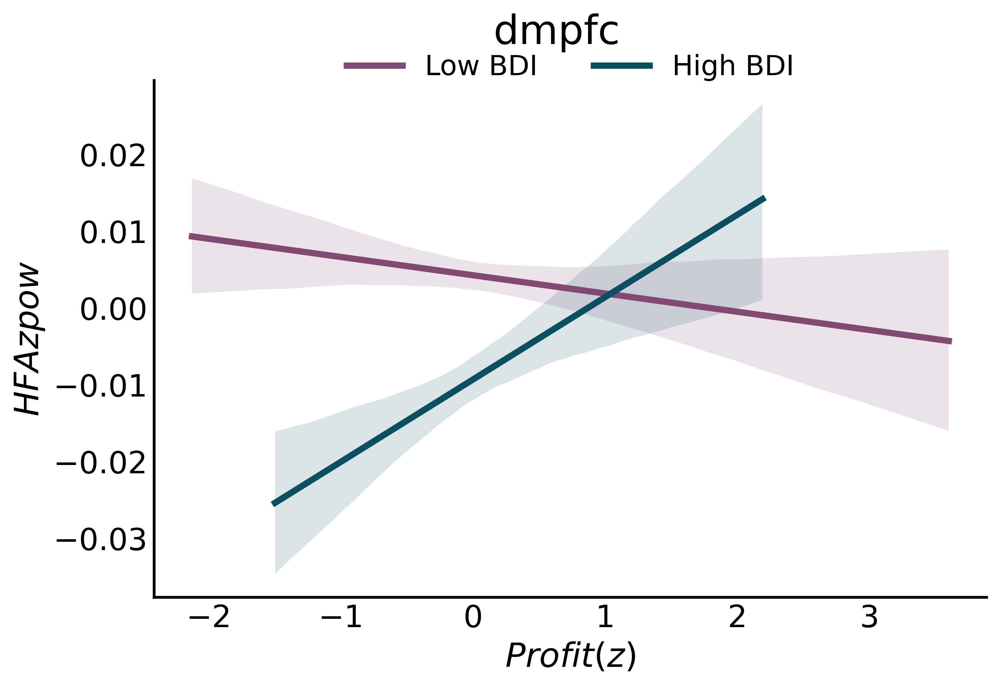

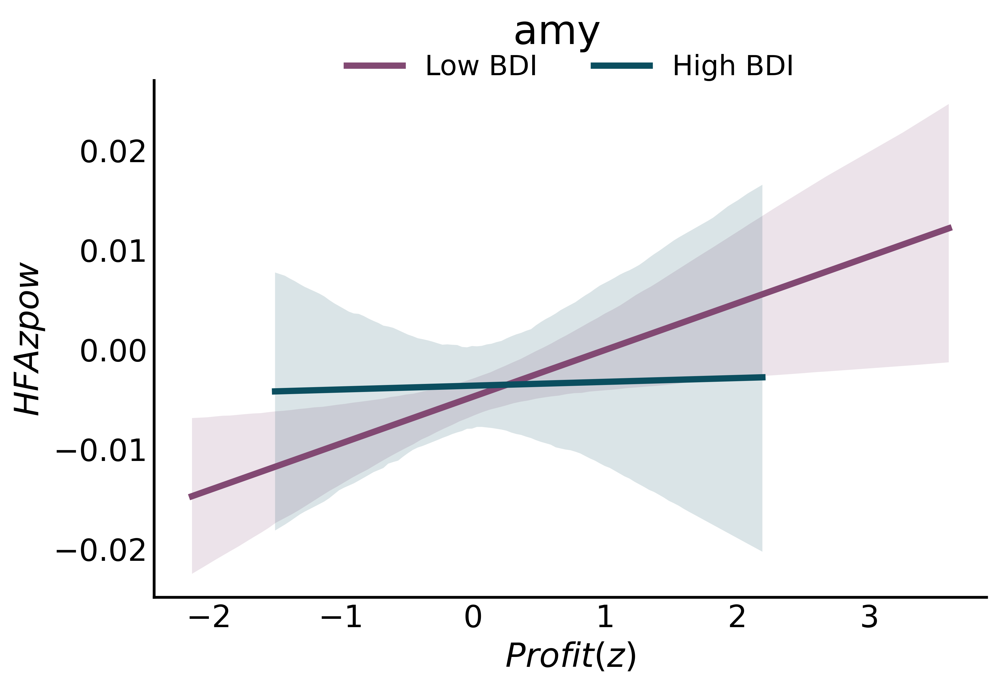

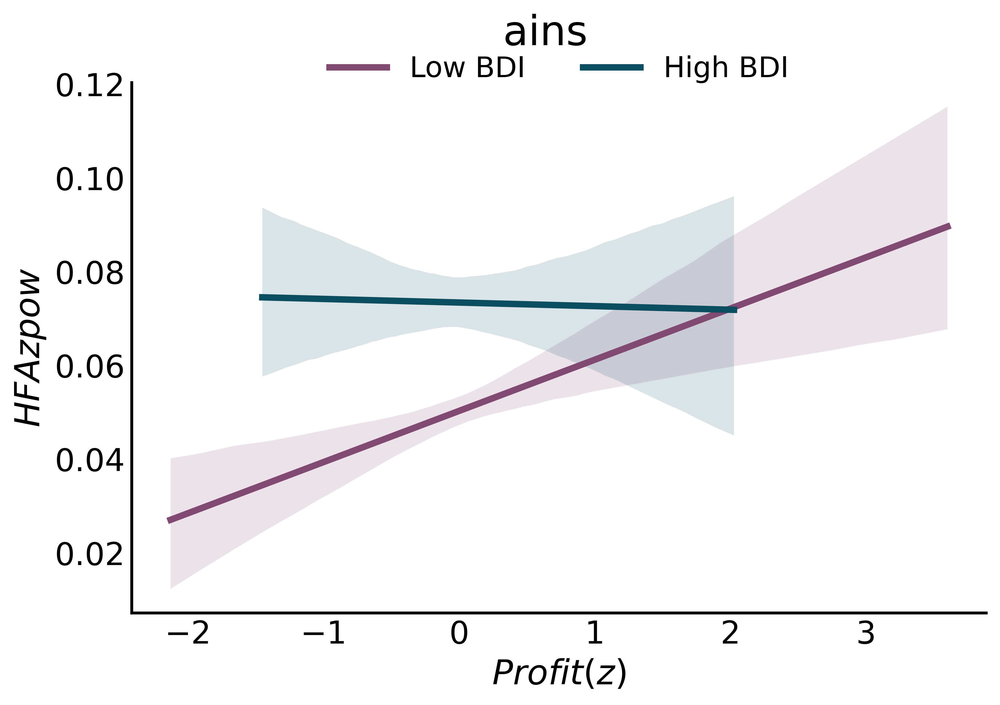

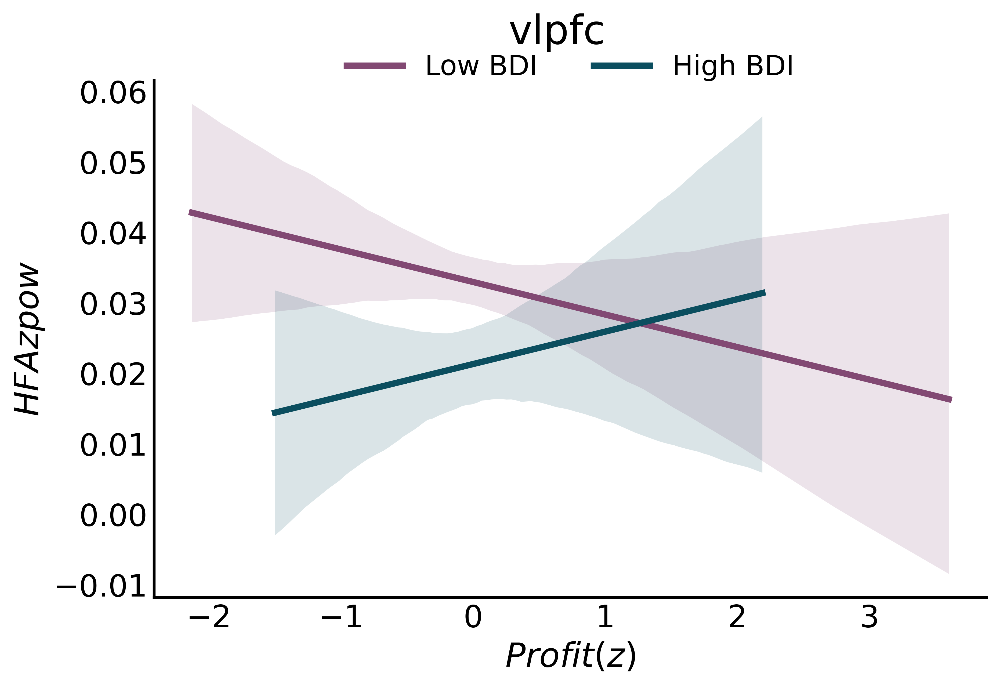

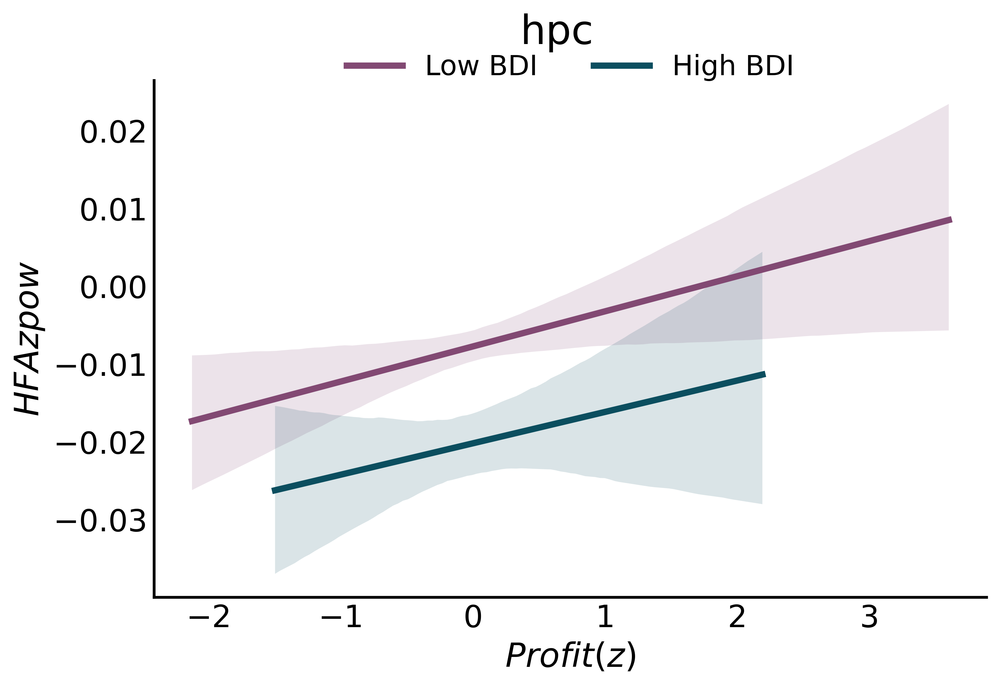

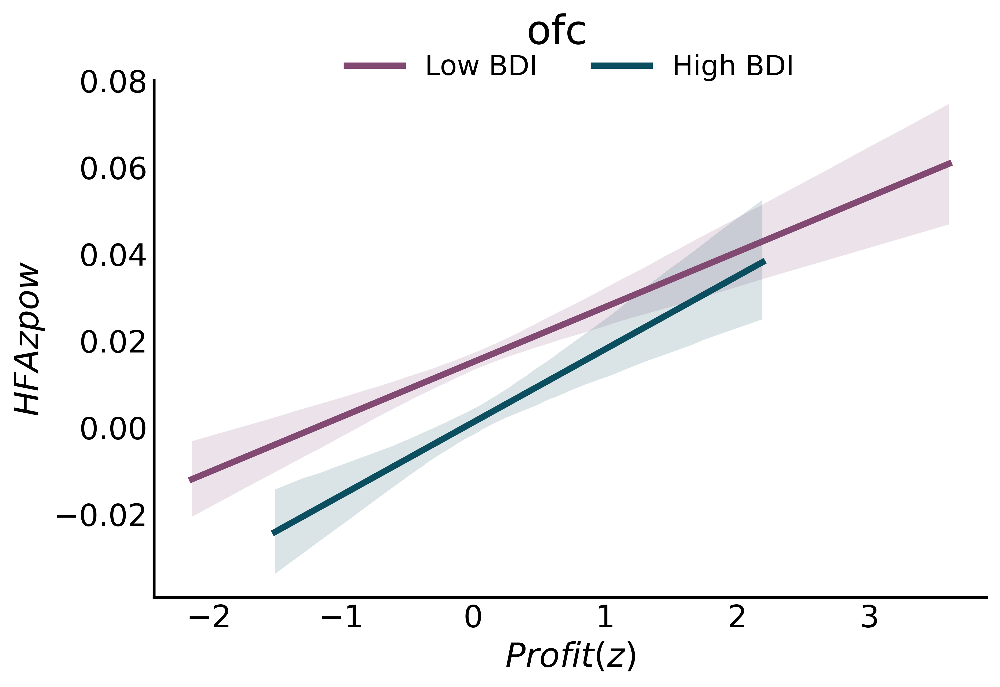

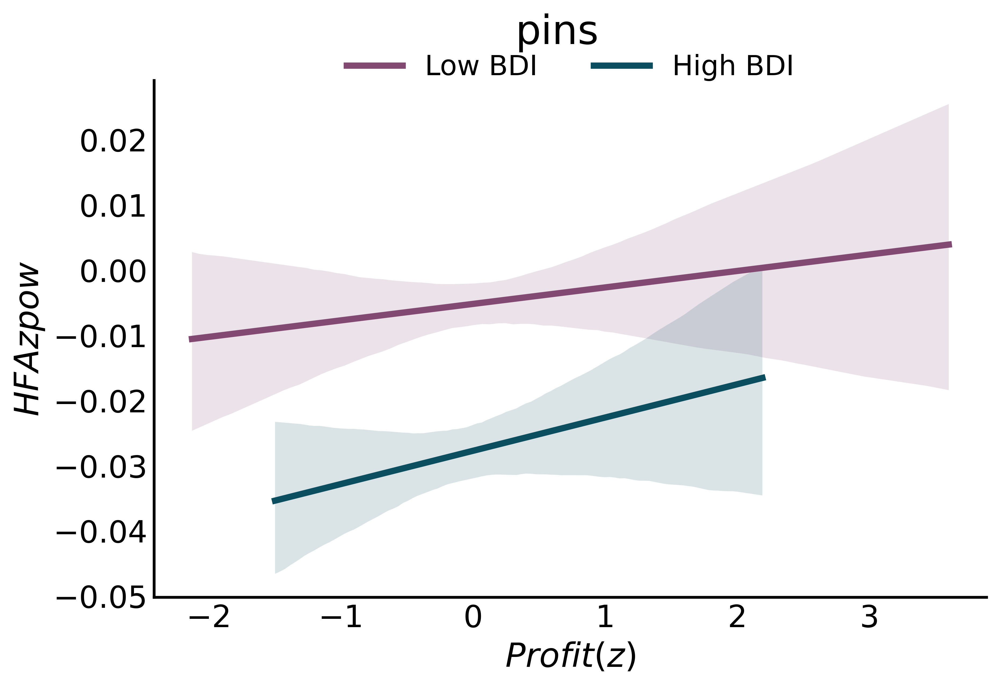

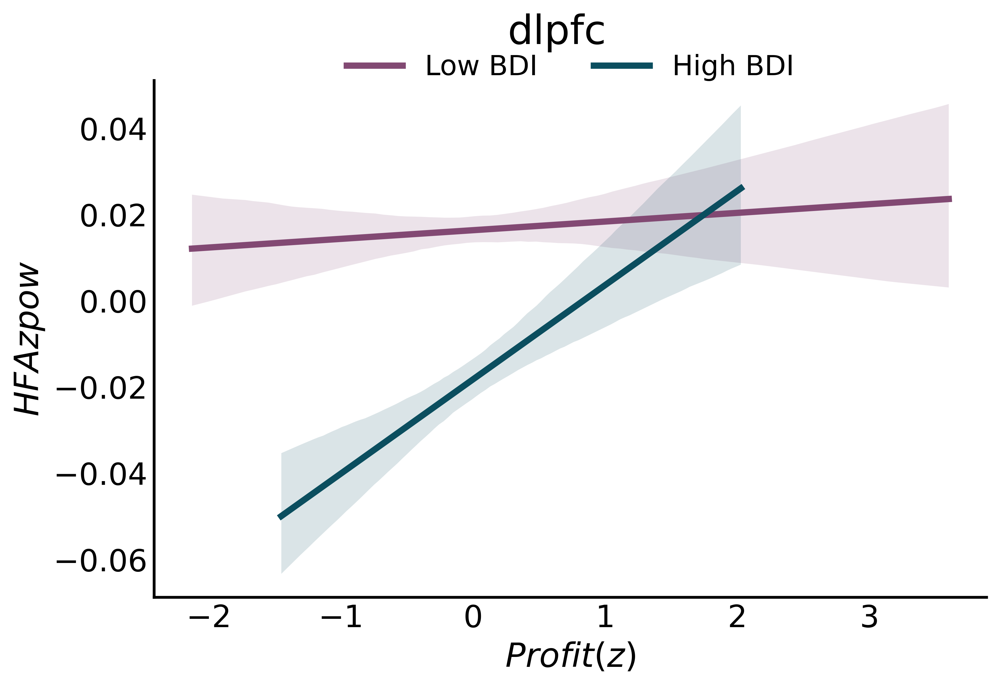

In [38]:
# corr_fig_dir = f'{fig_dir}{band}/{band}_pow_bdi_corr/'
# os.makedirs(corr_fig_dir,exist_ok=True)


# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in hfa_reg_df.roi.unique().tolist():
        
    roi_df = hfa_reg_df[hfa_reg_df.roi==roi]
    
#     fig_id = f'{band}_{roi}_bdi_pow_corr.pdf'

    fig,ax = plt.subplots(figsize=(8,5),dpi=500)



    sns.regplot(data=roi_df[roi_df.bdi_thresh=='low'],x='Profit',y='band_pow',scatter=False,
               ci=95,color = '#824973',label='Low BDI')
    sns.regplot(data=roi_df[roi_df.bdi_thresh=='high'],x='Profit',y='band_pow',scatter=False,
               ci=95,color='#0b4e5f',label='High BDI')

    plt.legend(fontsize=10)
    sns.move_legend(ax,"upper center", bbox_to_anchor=(0.5, 1.1), frameon=False,framealpha=0,
                    fontsize='small',shadow=None,
                    columnspacing=2,ncol=2)


    plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

    plt.ylabel(r'$HFA{{{zpow}}}$')
    plt.xlabel(r'$Profit(z)$')
    fig.suptitle(roi)
    sns.despine()
    plt.tick_params(length=0)


    # plt.savefig(f'{fig_save_dir}/all_lmplot_cpe_bpow_bdi_{date}.pdf', format='pdf', metadata=None,
    # bbox_inches='tight', pad_inches=0.1,dpi=500,
    # facecolor='auto', edgecolor='auto',
    # backend=None)